# Dental

In [32]:
from google.colab import drive
drive.mount('/content/gdrive/')

Drive already mounted at /content/gdrive/; to attempt to forcibly remount, call drive.mount("/content/gdrive/", force_remount=True).


In [23]:
# Import the necessary library
import os
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.metrics import precision_recall_curve, average_precision_score

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader, random_split
from torchvision.models import resnet18

In [24]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("salmansajid05/oral-diseases")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/oral-diseases


In [25]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Define the original directories and their corresponding class names
original_dirs = {
    'Caries': '/kaggle/input/oral-diseases/Data caries/Data caries/caries augmented data set/preview',
    'Gingivitis': '/kaggle/input/oral-diseases/Gingivitis/Gingivitis',
    'Ulcers': '/kaggle/input/oral-diseases/Mouth Ulcer/Mouth Ulcer/Mouth_Ulcer_augmented_DataSet/preview',
    'Tooth Discoloration': '/kaggle/input/oral-diseases/Tooth Discoloration/Tooth Discoloration /Tooth_discoloration_augmented_dataser/preview',
    'Hypodontia': '/kaggle/input/oral-diseases/hypodontia/hypodontia'
}

# Define the target base directory
base_dir = '/kaggle/working/dataset'

# Define the target structure
splits = ['train', 'val', 'test']
classes = list(original_dirs.keys())

# Create target directories
for split in splits:
    for class_name in classes:
        os.makedirs(os.path.join(base_dir, split, class_name), exist_ok=True)

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to copy images to the target directory and count them
def copy_and_count_images(class_name, image_paths):
    if not image_paths:
        print(f"No images found for class: {class_name}")
        return

    # Split the data
    train_paths, test_paths = train_test_split(image_paths, test_size=0.1, random_state=42)
    train_paths, val_paths = train_test_split(train_paths, test_size=0.2, random_state=42)  # 0.2 * 0.9 = 0.18

    # Check for empty splits
    if not train_paths or not val_paths or not test_paths:
        print(f"Warning: Empty split for {class_name}")
        return

    # Define split mappings
    split_paths = {
        'train': train_paths,
        'val': val_paths,
        'test': test_paths
    }

    # Copy images to their respective directories and count them
    for split, paths in split_paths.items():
        class_split_counts[class_name][split] = len(paths)
        for img_path in paths:
            target_path = os.path.join(base_dir, split, class_name, os.path.basename(img_path))
            shutil.copy(img_path, target_path)

# Traverse the original directories and gather image paths
for class_name, original_dir in original_dirs.items():
    if not os.path.exists(original_dir):
        print(f"Skipping {class_name}: Directory not found - {original_dir}")
        continue

    image_paths = []
    for root, dirs, files in os.walk(original_dir):
        image_paths.extend([os.path.join(root, file) for file in files if file.endswith(('.jpg', '.jpeg', '.png'))])

    print(f"{class_name}: Found {len(image_paths)} images.")
    if image_paths:
        copy_and_count_images(class_name, image_paths)

print("\nImages have been copied and organized successfully.")
print("\nNumber of images per class:")
for class_name, counts in class_split_counts.items():
    print(f"\n{class_name}:")
    print(f"  Train: {counts['train']}")
    print(f"  Val:   {counts['val']}")
    print(f"  Test:  {counts['test']}")


Caries: Found 2382 images.
Gingivitis: Found 2340 images.
Ulcers: Found 2541 images.
Tooth Discoloration: Found 1834 images.
Hypodontia: Found 342 images.

Images have been copied and organized successfully.

Number of images per class:

Caries:
  Train: 1714
  Val:   429
  Test:  239

Gingivitis:
  Train: 1684
  Val:   422
  Test:  234

Ulcers:
  Train: 1828
  Val:   458
  Test:  255

Tooth Discoloration:
  Train: 1320
  Val:   330
  Test:  184

Hypodontia:
  Train: 245
  Val:   62
  Test:  35


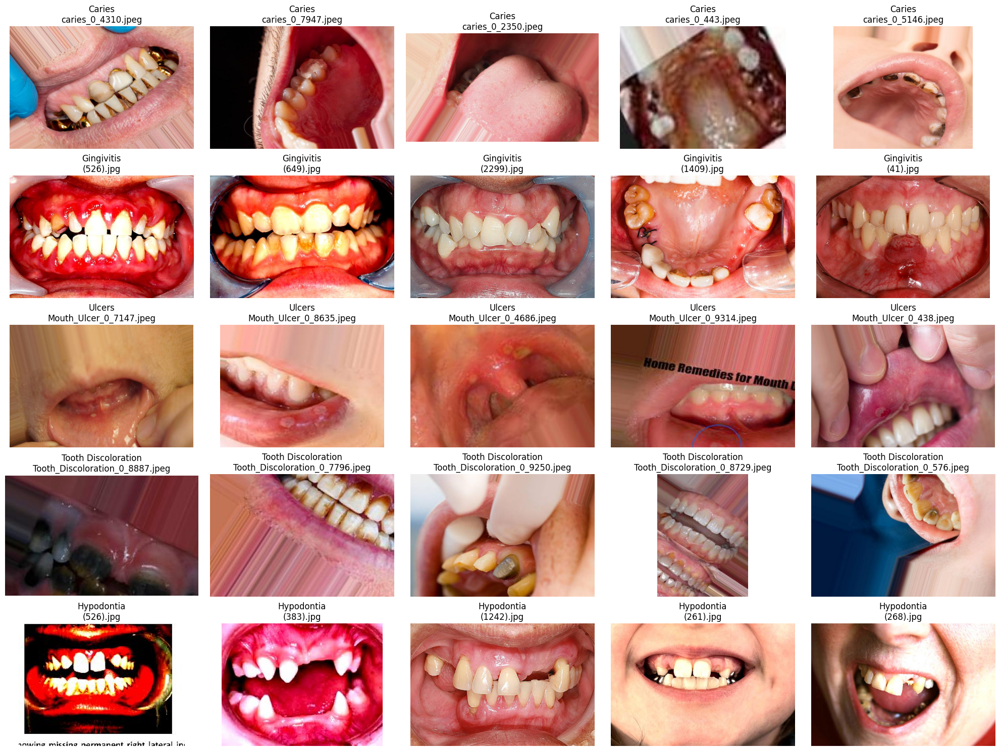

In [26]:
import matplotlib.pyplot as plt
import os

# Define the base directory where the dataset is organized
base_dir = '/kaggle/working/dataset'

# Define the classes
classes = [ 'Caries', 'Gingivitis', 'Ulcers', 'Tooth Discoloration', 'Hypodontia']

# Set up the plot
plt.figure(figsize=(20, 15))
num_samples = 5  # Number of images to display per class

# Loop through each class and display 5 images
for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, 'train', class_name)  # Use the 'train' split
    image_files = os.listdir(class_path)[:num_samples]  # Get the first 5 images

    for img_idx, img_file in enumerate(image_files):
        img_path = os.path.join(class_path, img_file)
        img = plt.imread(img_path)

        # Plot the image
        plt.subplot(len(classes), num_samples, class_idx * num_samples + img_idx + 1)
        plt.imshow(img)
        plt.title(f"{class_name}\n{img_file}")
        plt.axis('off')

plt.tight_layout()
plt.show()

Number of images per class:

Caries:
  Train: 1714
  Val:   429
  Test:  239

Gingivitis:
  Train: 1684
  Val:   422
  Test:  234

Ulcers:
  Train: 1828
  Val:   458
  Test:  255

Tooth Discoloration:
  Train: 1320
  Val:   330
  Test:  184

Hypodontia:
  Train: 245
  Val:   62
  Test:  35


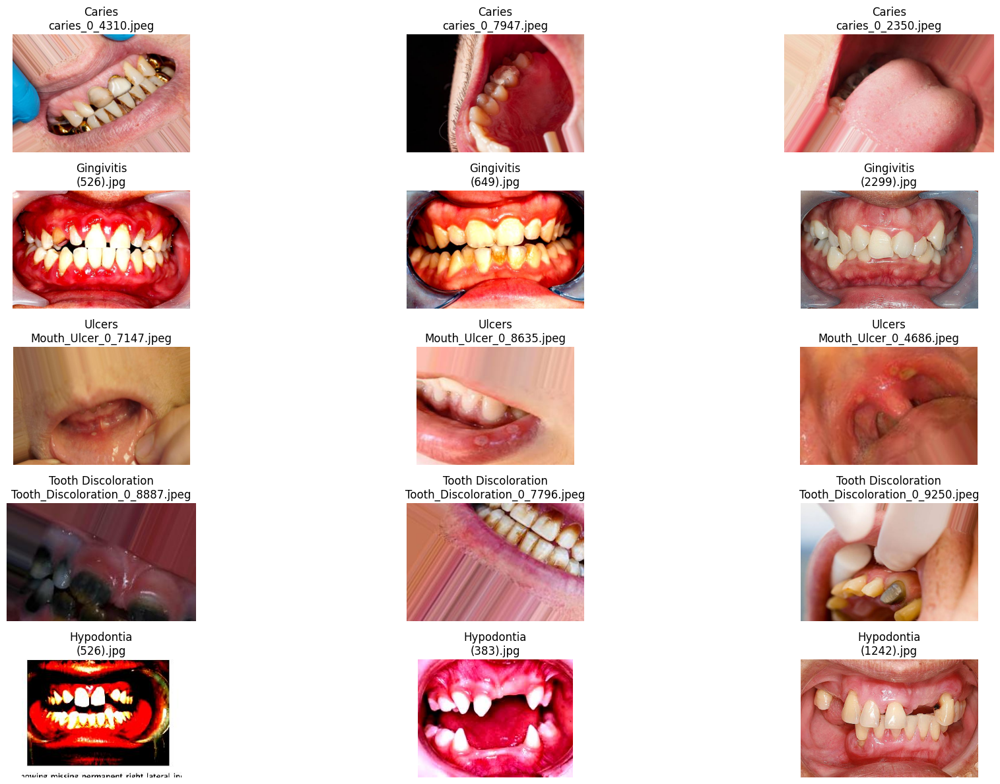

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Print the distribution of images per class and split
print("Number of images per class:")
for class_name, counts in class_split_counts.items():
    print(f"\n{class_name}:")
    print(f"  Train: {counts['train']}")
    print(f"  Val:   {counts['val']}")
    print(f"  Test:  {counts['test']}")

# Visualize sample images from each class
plt.figure(figsize=(20, 12))
splits_to_show = ['train', 'val', 'test']
num_samples = 3  # Number of samples to show per class

for class_idx, class_name in enumerate(classes):
    class_path = os.path.join(base_dir, 'train', class_name)
    image_files = os.listdir(class_path)[:num_samples]  # Get first 3 images

    for img_idx, img_file in enumerate(image_files):
        img_path = os.path.join(class_path, img_file)
        img = plt.imread(img_path)

        plt.subplot(len(classes), num_samples, class_idx * num_samples + img_idx + 1)
        plt.imshow(img)
        plt.title(f"{class_name}\n{img_file}")
        plt.axis('off')

plt.tight_layout()
plt.show()

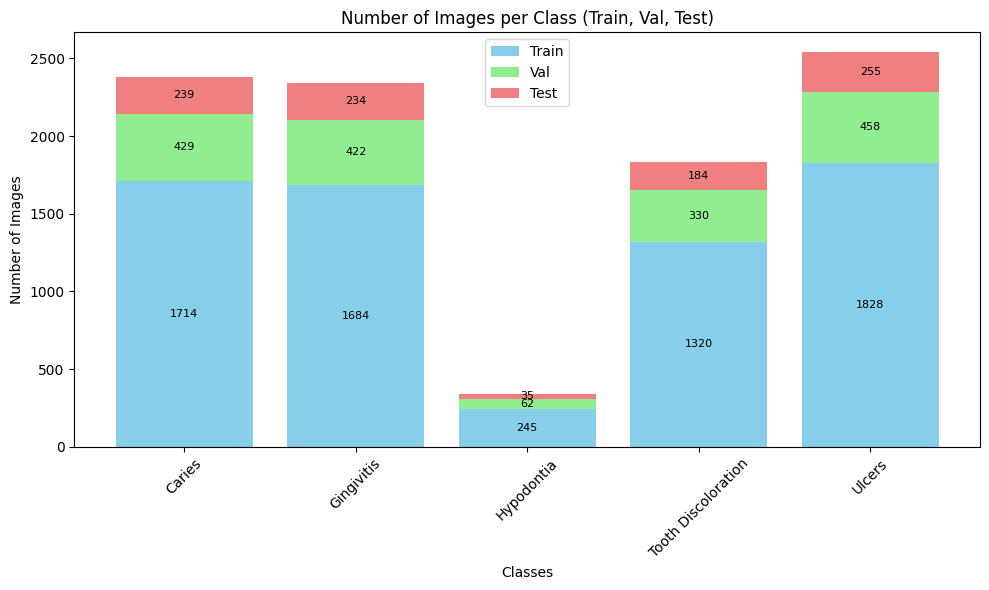

In [28]:
import os
import matplotlib.pyplot as plt

# Define class labels without 'Calculus'
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

# Define base directory
base_dir = '/kaggle/working/dataset'  # Update this path

# Initialize dictionaries to hold the counts for train, val, and test sets
class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in classes}

# Function to count images in each split
def count_images(base_dir, class_name):
    counts = {}
    for split in ['train', 'val', 'test']:
        split_dir = os.path.join(base_dir, split, class_name)
        if os.path.exists(split_dir):  # Check if directory exists
            counts[split] = len(os.listdir(split_dir))
        else:
            counts[split] = 0
    return counts

# Calculate counts for each class and split
for class_name in classes:
    class_split_counts[class_name] = count_images(base_dir, class_name)

# Create lists for the bar plot
labels = classes
train_counts = [class_split_counts[class_name]['train'] for class_name in classes]
val_counts = [class_split_counts[class_name]['val'] for class_name in classes]
test_counts = [class_split_counts[class_name]['test'] for class_name in classes]

x = range(len(classes))

# Create the stacked bar plot
fig, ax = plt.subplots(figsize=(10, 6))

bar1 = ax.bar(x, train_counts, label='Train', color='skyblue')
bar2 = ax.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
bar3 = ax.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')

ax.set_xlabel('Classes')
ax.set_ylabel('Number of Images')
ax.set_title('Number of Images per Class (Train, Val, Test)')
ax.set_xticks(x)
ax.set_xticklabels(labels, rotation=45)
ax.legend()

# Add data labels with corrected positions
for bar in bar1:
    height = bar.get_height()
    if height > 0:  # Only label if height is greater than 0
        ax.text(bar.get_x() + bar.get_width()/2, height / 2, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar2:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

for bar in bar3:
    height = bar.get_height()
    if height > 0:
        y_pos = bar.get_y() + height / 2  # Middle of the current segment
        ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                ha='center', va='center', color='black', fontsize=8)

plt.tight_layout()
plt.show()

In [29]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms

# Define directories
base_dir = '/kaggle/working/dataset'  # Update this path
train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Parameters
image_size = (128, 128)
batch_size = 16
num_epochs = 10

# Define class labels without 'Calculus'
classes = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']

# Data augmentation and normalization for training
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(image_size, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Normalization for validation and testing
val_transforms = transforms.Compose([
    transforms.Resize(image_size),
    transforms.CenterCrop(image_size),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
])

# Custom dataset class to exclude
class MedicalDataset(Dataset):
    def __init__(self, data_dir, transform=None):
        self.data_dir = data_dir
        self.transform = transform

        self.classes = [cls for cls in os.listdir(data_dir) if cls != 'Calculus']
        self.classes = sorted(self.classes, key=lambda x: classes.index(x))
        self.class_to_idx = {cls: i for i, cls in enumerate(self.classes)}
        self.samples = self._make_dataset()

    def _make_dataset(self):
        samples = []
        for cls in self.classes:
            cls_dir = os.path.join(self.data_dir, cls)
            for img_name in os.listdir(cls_dir):
                samples.append((os.path.join(cls_dir, img_name), self.class_to_idx[cls]))
        return samples

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, label

# Load datasets using the custom MedicalDataset
train_dataset = MedicalDataset(train_dir, transform=train_transforms)
val_dataset = MedicalDataset(val_dir, transform=val_transforms)
test_dataset = MedicalDataset(test_dir, transform=val_transforms)

# Create data loaders with reduced num_workers
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

In [30]:
# Assuming train_loader, val_loader, and test_loader are already defined

# Extract classes from train_loader
train_classes = train_loader.dataset.classes
print("Classes in train_loader:", train_classes)

# Extract classes from val_loader
val_classes = val_loader.dataset.classes
print("Classes in val_loader:", val_classes)

# Extract classes from test_loader
test_classes = test_loader.dataset.classes
print("Classes in test_loader:", test_classes)

print('*'*50)


# Extract the number of samples from train_loader
num_train_samples = len(train_loader.dataset)

# Print the result
print("Number of training samples:", num_train_samples)

# Extract the number of samples from train_loader
num_val_samples = len(val_loader.dataset)

# Print the result
print("Number of validation samples:", num_val_samples)

# Extract the number of samples from train_loader
num_test_samples = len(test_loader.dataset)

# Print the result
print("Number of testing samples:", num_test_samples)

Classes in train_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Classes in val_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Classes in test_loader: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
**************************************************
Number of training samples: 6791
Number of validation samples: 1701
Number of testing samples: 947


Using device: cuda


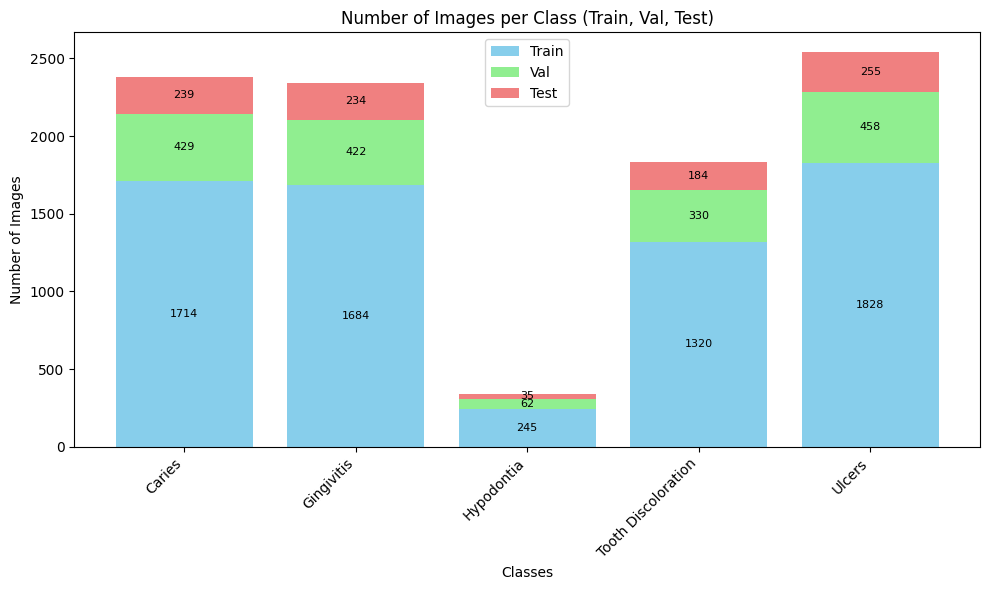


--- Dataset Statistics ---
Classes identified: ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
Number of training samples: 6791
Number of validation samples: 1701
Number of testing samples: 947
-------------------------


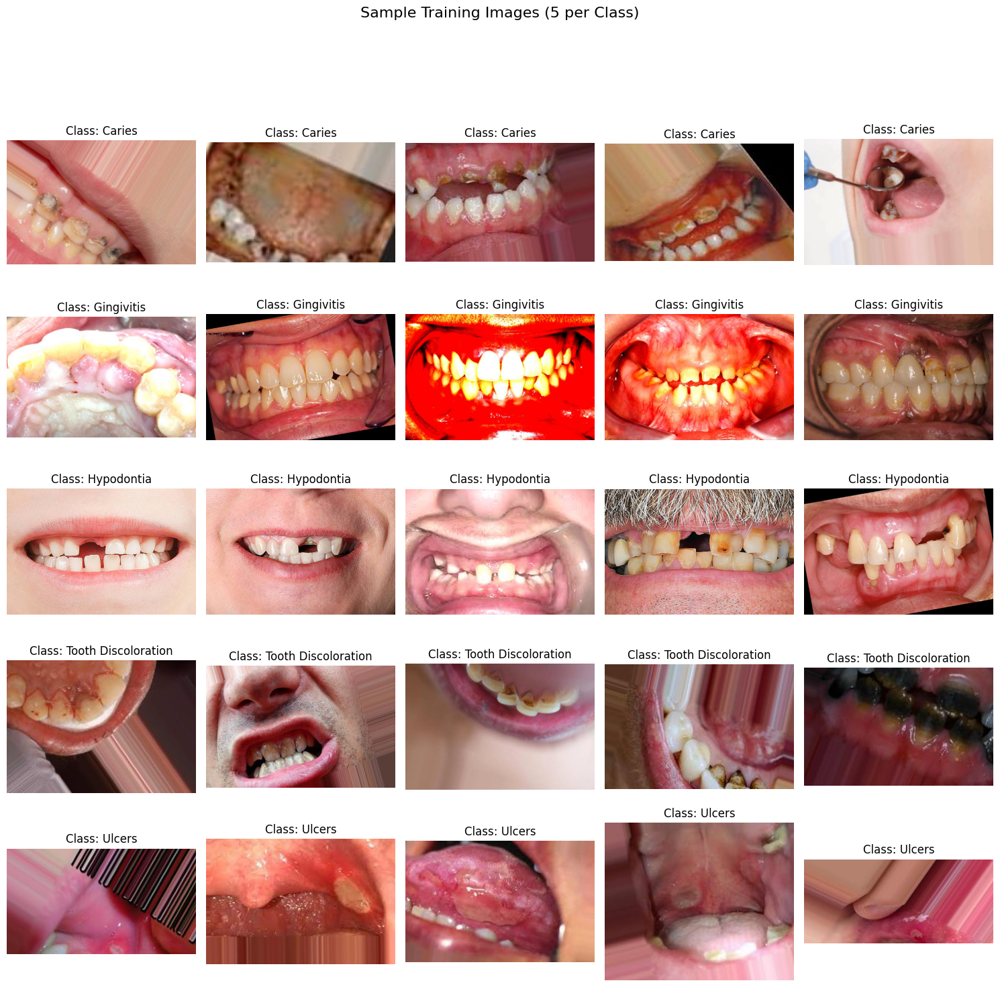


=== Plotting Histogram of Pixel Intensities (Training Set) ===


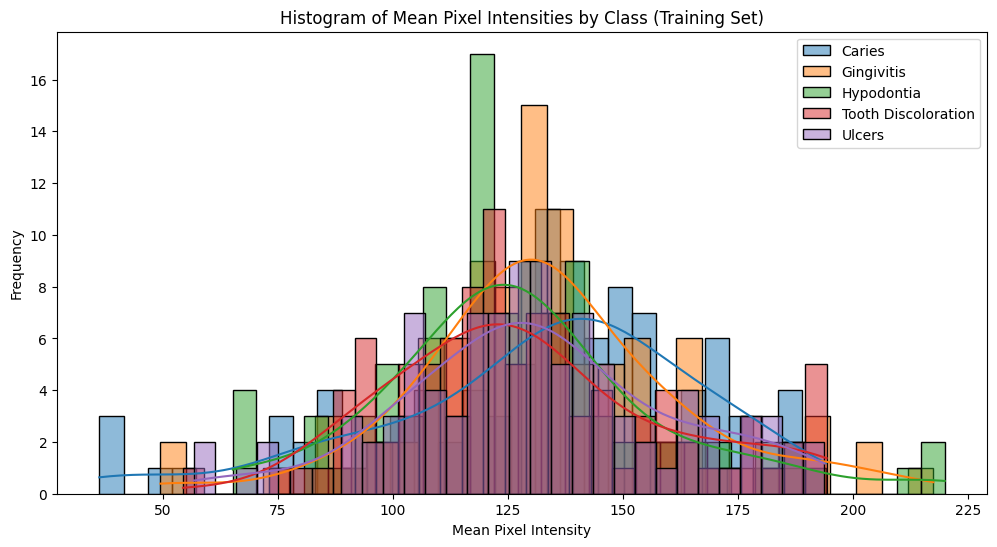


=== Starting training for densenet121 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.25it/s]


[densenet121] Ep01 | Train Loss: 0.1041 Acc: 75.03% | Val Loss: 0.0322 Acc: 89.24%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.45it/s]


[densenet121] Ep02 | Train Loss: 0.0551 Acc: 88.32% | Val Loss: 0.0152 Acc: 95.00%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.09it/s]


[densenet121] Ep03 | Train Loss: 0.0412 Acc: 92.40% | Val Loss: 0.0112 Acc: 96.00%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.53it/s]


[densenet121] Ep04 | Train Loss: 0.0354 Acc: 93.96% | Val Loss: 0.0063 Acc: 97.88%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.62it/s]


[densenet121] Ep05 | Train Loss: 0.0300 Acc: 95.58% | Val Loss: 0.0081 Acc: 97.30%


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.68it/s]


[densenet121] Ep06 | Train Loss: 0.0273 Acc: 96.02% | Val Loss: 0.0052 Acc: 98.12%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.03it/s]


[densenet121] Ep07 | Train Loss: 0.0274 Acc: 95.99% | Val Loss: 0.0060 Acc: 97.82%


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.45it/s]


[densenet121] Ep08 | Train Loss: 0.0258 Acc: 96.44% | Val Loss: 0.0057 Acc: 98.06%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.26it/s]


[densenet121] Ep09 | Train Loss: 0.0242 Acc: 96.95% | Val Loss: 0.0042 Acc: 98.41%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.74it/s]


[densenet121] Ep10 | Train Loss: 0.0225 Acc: 97.17% | Val Loss: 0.0033 Acc: 99.06%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.13it/s]


[densenet121] Ep11 | Train Loss: 0.0241 Acc: 96.82% | Val Loss: 0.0048 Acc: 98.30%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.01it/s]


[densenet121] Ep12 | Train Loss: 0.0230 Acc: 96.86% | Val Loss: 0.0027 Acc: 99.35%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.99it/s]


[densenet121] Ep13 | Train Loss: 0.0226 Acc: 97.32% | Val Loss: 0.0054 Acc: 98.24%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.62it/s]


[densenet121] Ep14 | Train Loss: 0.0224 Acc: 97.47% | Val Loss: 0.0049 Acc: 98.18%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.57it/s]


[densenet121] Ep15 | Train Loss: 0.0220 Acc: 97.41% | Val Loss: 0.0041 Acc: 98.47%


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.47it/s]


[densenet121] Ep16 | Train Loss: 0.0190 Acc: 98.35% | Val Loss: 0.0025 Acc: 99.06%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.47it/s]


[densenet121] Ep17 | Train Loss: 0.0164 Acc: 98.94% | Val Loss: 0.0026 Acc: 99.12%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.13it/s]


[densenet121] Ep18 | Train Loss: 0.0191 Acc: 98.19% | Val Loss: 0.0025 Acc: 99.18%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.64it/s]


[densenet121] Ep19 | Train Loss: 0.0172 Acc: 98.51% | Val Loss: 0.0036 Acc: 98.71%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.69it/s]


[densenet121] Ep20 | Train Loss: 0.0173 Acc: 98.66% | Val Loss: 0.0025 Acc: 99.24%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.63it/s]


[densenet121] Ep21 | Train Loss: 0.0167 Acc: 98.72% | Val Loss: 0.0024 Acc: 98.88%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_densenet121.pth (Validation loss improved)


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.76it/s]


[densenet121] Ep22 | Train Loss: 0.0154 Acc: 99.10% | Val Loss: 0.0032 Acc: 98.94%


Epoch 23/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.09it/s]


[densenet121] Ep23 | Train Loss: 0.0185 Acc: 98.32% | Val Loss: 0.0041 Acc: 98.88%


Epoch 24/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.71it/s]


[densenet121] Ep24 | Train Loss: 0.0173 Acc: 98.63% | Val Loss: 0.0028 Acc: 99.12%


Epoch 25/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.74it/s]


[densenet121] Ep25 | Train Loss: 0.0146 Acc: 99.26% | Val Loss: 0.0031 Acc: 99.24%


Epoch 26/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.44it/s]


[densenet121] Ep26 | Train Loss: 0.0151 Acc: 99.16% | Val Loss: 0.0028 Acc: 98.71%
   -> Early stopping triggered for densenet121 after 26 epochs.

=== Starting training for tf_efficientnetv2_s.in21k for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.54it/s]


[tf_efficientnetv2_s.in21k] Ep01 | Train Loss: 0.0796 Acc: 81.65% | Val Loss: 0.0142 Acc: 95.18%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.44it/s]


[tf_efficientnetv2_s.in21k] Ep02 | Train Loss: 0.0391 Acc: 92.81% | Val Loss: 0.0084 Acc: 97.65%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.53it/s]


[tf_efficientnetv2_s.in21k] Ep03 | Train Loss: 0.0328 Acc: 94.77% | Val Loss: 0.0047 Acc: 98.47%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.19it/s]


[tf_efficientnetv2_s.in21k] Ep04 | Train Loss: 0.0264 Acc: 96.22% | Val Loss: 0.0039 Acc: 98.41%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.45it/s]


[tf_efficientnetv2_s.in21k] Ep05 | Train Loss: 0.0220 Acc: 97.48% | Val Loss: 0.0035 Acc: 98.94%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.67it/s]


[tf_efficientnetv2_s.in21k] Ep06 | Train Loss: 0.0247 Acc: 96.76% | Val Loss: 0.0046 Acc: 98.47%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.60it/s]


[tf_efficientnetv2_s.in21k] Ep07 | Train Loss: 0.0203 Acc: 97.98% | Val Loss: 0.0032 Acc: 99.06%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.13it/s]


[tf_efficientnetv2_s.in21k] Ep08 | Train Loss: 0.0262 Acc: 96.35% | Val Loss: 0.0047 Acc: 98.06%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.30it/s]


[tf_efficientnetv2_s.in21k] Ep09 | Train Loss: 0.0204 Acc: 97.85% | Val Loss: 0.0058 Acc: 98.35%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.65it/s]


[tf_efficientnetv2_s.in21k] Ep10 | Train Loss: 0.0193 Acc: 97.92% | Val Loss: 0.0035 Acc: 98.82%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.49it/s]


[tf_efficientnetv2_s.in21k] Ep11 | Train Loss: 0.0182 Acc: 98.37% | Val Loss: 0.0023 Acc: 99.24%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.26it/s]


[tf_efficientnetv2_s.in21k] Ep12 | Train Loss: 0.0253 Acc: 96.61% | Val Loss: 0.0047 Acc: 98.18%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.09it/s]


[tf_efficientnetv2_s.in21k] Ep13 | Train Loss: 0.0182 Acc: 98.38% | Val Loss: 0.0035 Acc: 99.06%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.19it/s]


[tf_efficientnetv2_s.in21k] Ep14 | Train Loss: 0.0182 Acc: 98.23% | Val Loss: 0.0031 Acc: 98.94%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.22it/s]


[tf_efficientnetv2_s.in21k] Ep15 | Train Loss: 0.0161 Acc: 98.76% | Val Loss: 0.0021 Acc: 99.29%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.34it/s]


[tf_efficientnetv2_s.in21k] Ep16 | Train Loss: 0.0174 Acc: 98.45% | Val Loss: 0.0025 Acc: 99.24%


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.32it/s]


[tf_efficientnetv2_s.in21k] Ep17 | Train Loss: 0.0169 Acc: 98.59% | Val Loss: 0.0019 Acc: 99.12%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_tf_efficientnetv2_s.in21k.pth (Validation loss improved)


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.98it/s]


[tf_efficientnetv2_s.in21k] Ep18 | Train Loss: 0.0147 Acc: 99.16% | Val Loss: 0.0022 Acc: 98.94%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:05<00:00,  9.29it/s]


[tf_efficientnetv2_s.in21k] Ep19 | Train Loss: 0.0169 Acc: 98.54% | Val Loss: 0.0030 Acc: 99.00%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.10it/s]


[tf_efficientnetv2_s.in21k] Ep20 | Train Loss: 0.0149 Acc: 99.07% | Val Loss: 0.0025 Acc: 99.29%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.66it/s]


[tf_efficientnetv2_s.in21k] Ep21 | Train Loss: 0.0150 Acc: 99.18% | Val Loss: 0.0045 Acc: 98.77%


Epoch 22/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.16it/s]


[tf_efficientnetv2_s.in21k] Ep22 | Train Loss: 0.0149 Acc: 99.09% | Val Loss: 0.0035 Acc: 99.00%
   -> Early stopping triggered for tf_efficientnetv2_s.in21k after 22 epochs.

=== Starting training for resnet50 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.60it/s]


[resnet50] Ep01 | Train Loss: 0.1213 Acc: 70.05% | Val Loss: 0.0358 Acc: 88.83%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.66it/s]


[resnet50] Ep02 | Train Loss: 0.0662 Acc: 85.22% | Val Loss: 0.0177 Acc: 94.00%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.59it/s]


[resnet50] Ep03 | Train Loss: 0.0485 Acc: 89.93% | Val Loss: 0.0114 Acc: 96.59%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.86it/s]


[resnet50] Ep04 | Train Loss: 0.0390 Acc: 93.21% | Val Loss: 0.0091 Acc: 97.41%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.23it/s]


[resnet50] Ep05 | Train Loss: 0.0324 Acc: 94.86% | Val Loss: 0.0073 Acc: 97.30%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.78it/s]


[resnet50] Ep06 | Train Loss: 0.0289 Acc: 95.86% | Val Loss: 0.0059 Acc: 98.35%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.57it/s]


[resnet50] Ep07 | Train Loss: 0.0278 Acc: 96.01% | Val Loss: 0.0056 Acc: 98.30%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.49it/s]


[resnet50] Ep08 | Train Loss: 0.0236 Acc: 97.41% | Val Loss: 0.0064 Acc: 97.82%


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.02it/s]


[resnet50] Ep09 | Train Loss: 0.0230 Acc: 97.36% | Val Loss: 0.0062 Acc: 98.06%


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.39it/s]


[resnet50] Ep10 | Train Loss: 0.0228 Acc: 97.39% | Val Loss: 0.0048 Acc: 98.41%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.72it/s]


[resnet50] Ep11 | Train Loss: 0.0204 Acc: 98.16% | Val Loss: 0.0035 Acc: 98.65%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.54it/s]


[resnet50] Ep12 | Train Loss: 0.0192 Acc: 98.41% | Val Loss: 0.0048 Acc: 98.41%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.68it/s]


[resnet50] Ep13 | Train Loss: 0.0192 Acc: 98.56% | Val Loss: 0.0048 Acc: 98.24%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 13.16it/s]


[resnet50] Ep14 | Train Loss: 0.0175 Acc: 98.70% | Val Loss: 0.0039 Acc: 98.94%


Epoch 15/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.71it/s]


[resnet50] Ep15 | Train Loss: 0.0183 Acc: 98.56% | Val Loss: 0.0033 Acc: 98.88%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 16/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.28it/s]


[resnet50] Ep16 | Train Loss: 0.0183 Acc: 98.54% | Val Loss: 0.0024 Acc: 99.24%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_resnet50.pth (Validation loss improved)


Epoch 17/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.32it/s]


[resnet50] Ep17 | Train Loss: 0.0175 Acc: 98.70% | Val Loss: 0.0027 Acc: 99.12%


Epoch 18/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.78it/s]


[resnet50] Ep18 | Train Loss: 0.0168 Acc: 98.79% | Val Loss: 0.0032 Acc: 98.94%


Epoch 19/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.77it/s]


[resnet50] Ep19 | Train Loss: 0.0156 Acc: 99.23% | Val Loss: 0.0027 Acc: 99.00%


Epoch 20/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.61it/s]


[resnet50] Ep20 | Train Loss: 0.0153 Acc: 99.28% | Val Loss: 0.0028 Acc: 98.94%


Epoch 21/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 15.16it/s]


[resnet50] Ep21 | Train Loss: 0.0161 Acc: 99.10% | Val Loss: 0.0034 Acc: 99.00%
   -> Early stopping triggered for resnet50 after 21 epochs.

=== Starting training for inception_v3 for 50 epochs ===


Epoch 1/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.91it/s]


[inception_v3] Ep01 | Train Loss: 0.1435 Acc: 64.97% | Val Loss: 0.1771 Acc: 76.95%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 2/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.74it/s]


[inception_v3] Ep02 | Train Loss: 0.0896 Acc: 79.49% | Val Loss: 0.0391 Acc: 88.01%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 3/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.61it/s]


[inception_v3] Ep03 | Train Loss: 0.0784 Acc: 81.89% | Val Loss: 0.0376 Acc: 86.65%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 4/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.62it/s]


[inception_v3] Ep04 | Train Loss: 0.0627 Acc: 86.11% | Val Loss: 0.3110 Acc: 83.60%


Epoch 5/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.34it/s]


[inception_v3] Ep05 | Train Loss: 0.0612 Acc: 86.56% | Val Loss: 0.0283 Acc: 90.06%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 6/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.62it/s]


[inception_v3] Ep06 | Train Loss: 0.0476 Acc: 89.97% | Val Loss: 0.0323 Acc: 88.89%


Epoch 7/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.88it/s]


[inception_v3] Ep07 | Train Loss: 0.0435 Acc: 91.12% | Val Loss: 0.0164 Acc: 94.24%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 8/50 (Val): 100%|██████████| 54/54 [00:05<00:00, 10.13it/s]


[inception_v3] Ep08 | Train Loss: 0.0391 Acc: 92.59% | Val Loss: 0.0155 Acc: 95.00%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 9/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.84it/s]


[inception_v3] Ep09 | Train Loss: 0.0330 Acc: 94.42% | Val Loss: 0.0089 Acc: 97.12%
   -> Model saved to /content/gdrive/MyDrive/dental_models/best_model_inception_v3.pth (Validation loss improved)


Epoch 10/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 14.45it/s]


[inception_v3] Ep10 | Train Loss: 0.0334 Acc: 94.57% | Val Loss: 0.0169 Acc: 94.83%


Epoch 11/50 (Val): 100%|██████████| 54/54 [00:03<00:00, 13.93it/s]


[inception_v3] Ep11 | Train Loss: 0.0298 Acc: 95.10% | Val Loss: 0.0150 Acc: 95.41%


Epoch 12/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 12.69it/s]


[inception_v3] Ep12 | Train Loss: 0.0305 Acc: 94.86% | Val Loss: 0.0151 Acc: 94.83%


Epoch 13/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.08it/s]


[inception_v3] Ep13 | Train Loss: 0.0299 Acc: 95.07% | Val Loss: 0.0103 Acc: 96.83%


Epoch 14/50 (Val): 100%|██████████| 54/54 [00:04<00:00, 11.11it/s]


[inception_v3] Ep14 | Train Loss: 0.0293 Acc: 95.45% | Val Loss: 0.0125 Acc: 95.41%
   -> Early stopping triggered for inception_v3 after 14 epochs.

=== Plotting Individual Model Learning Curves ===


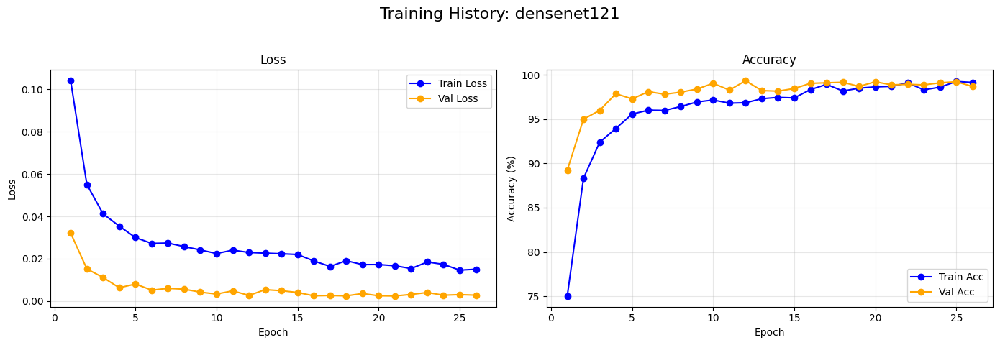

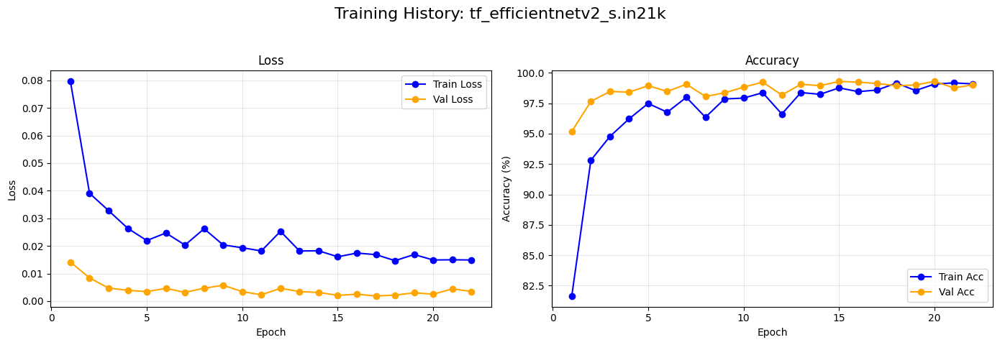

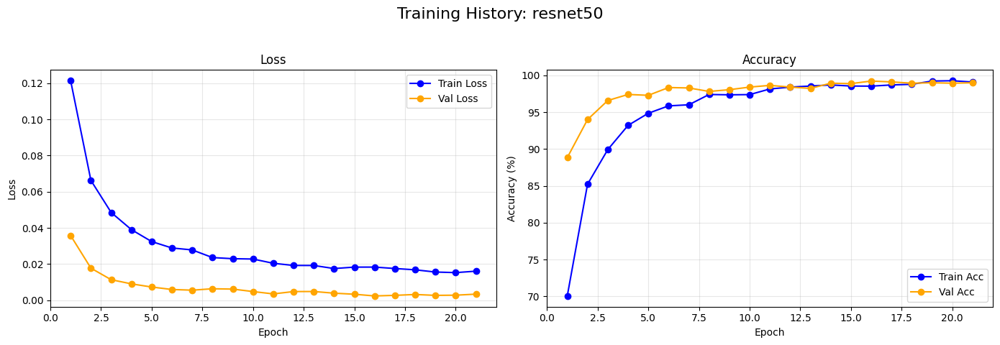

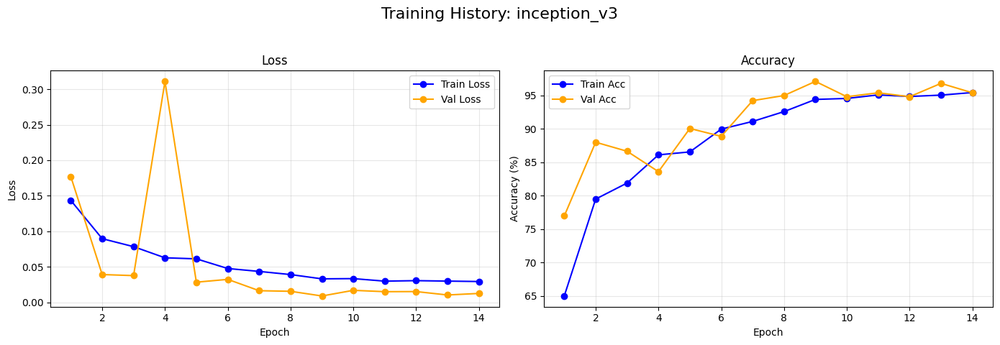


==================== Evaluating Individual Models for Ensemble Weights ====================

--- Evaluating Individual Model: densenet121 ---


TTA Validation: 100%|██████████| 60/60 [00:08<00:00,  7.29it/s]


   -> Test Accuracy (with TTA): 99.26%


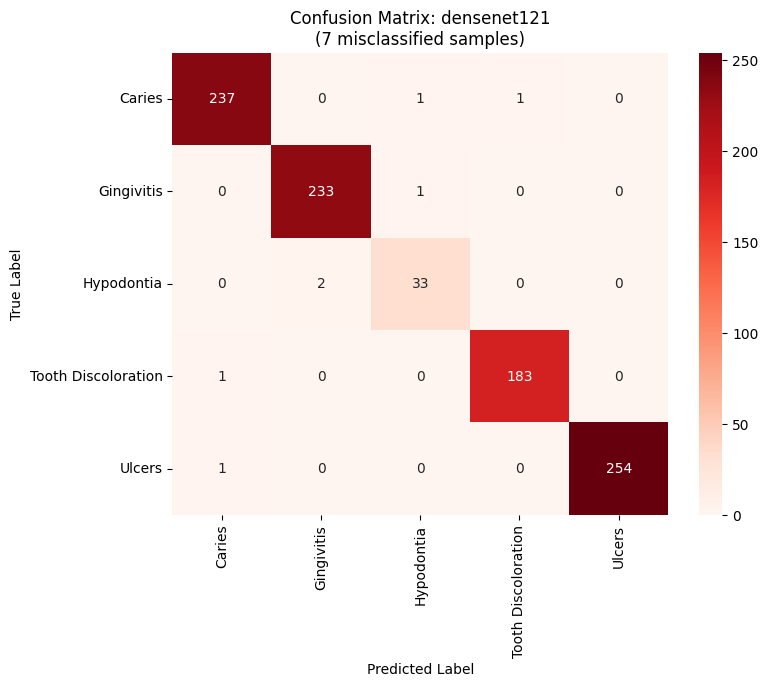


--- Evaluating Individual Model: tf_efficientnetv2_s.in21k ---


TTA Validation: 100%|██████████| 60/60 [00:07<00:00,  8.07it/s]


   -> Test Accuracy (with TTA): 99.68%


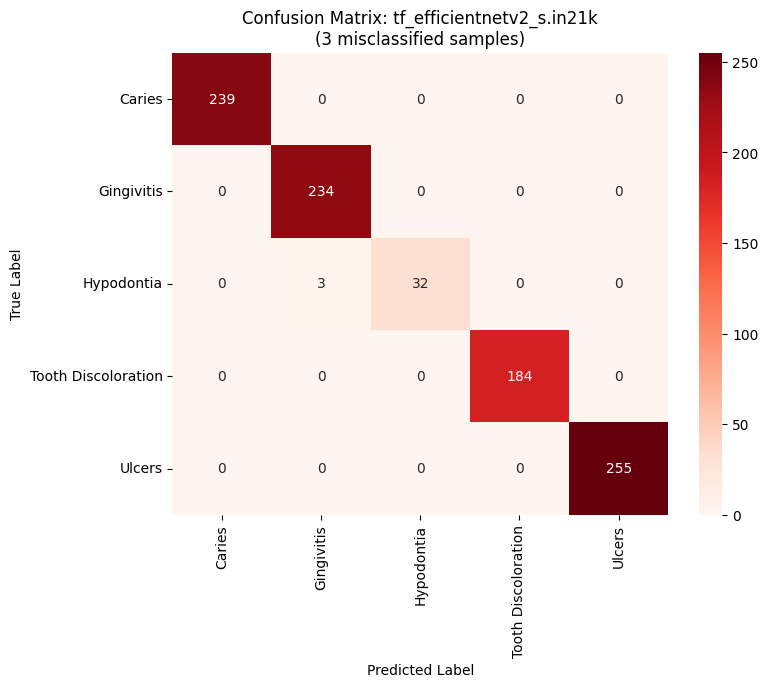


--- Evaluating Individual Model: resnet50 ---


TTA Validation: 100%|██████████| 60/60 [00:07<00:00,  8.35it/s]


   -> Test Accuracy (with TTA): 99.58%


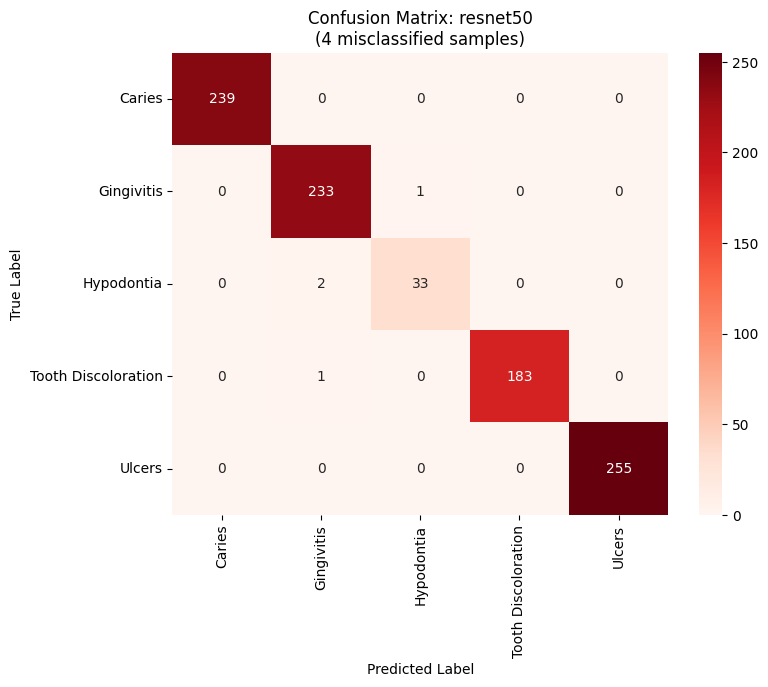


--- Evaluating Individual Model: inception_v3 ---


TTA Validation: 100%|██████████| 60/60 [00:06<00:00,  9.09it/s]


   -> Test Accuracy (with TTA): 97.57%


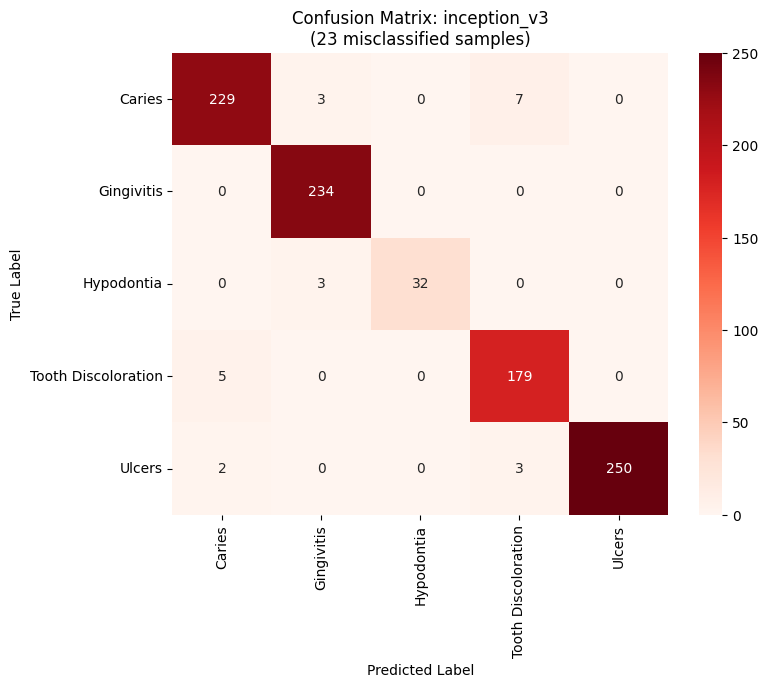


==================== Final Weighted Ensemble Evaluation ====================

Calculated Model Weights for Ensemble:
   - densenet121: 0.2507
   - tf_efficientnetv2_s.in21k: 0.2513
   - resnet50: 0.2516
   - inception_v3: 0.2463

==================== Final Weighted Ensemble Evaluation Results ====================
Ensemble Accuracy:           0.9968
Ensemble Balanced Accuracy:  0.9829
Ensemble Precision:          0.9969
Ensemble Recall:             0.9968
Ensemble F1-Score:           0.9968
Ensemble Specificity:        0.9992
Ensemble Cohen's Kappa:      0.9958
Ensemble MCC:                0.9959
Ensemble Log Loss:           0.1148
Ensemble Brier Score:        0.0043
Ensemble AUC:                0.9999

=== Ensemble False-Negative Rate per Class ===
Caries: 0.0000
Gingivitis: 0.0000
Hypodontia: 0.0857
Tooth Discoloration: 0.0000
Ulcers: 0.0000

--- Ensemble Classification Report (Per-Class) ---
Class                Precision    Recall  F1-Score   Support
-------------------------------

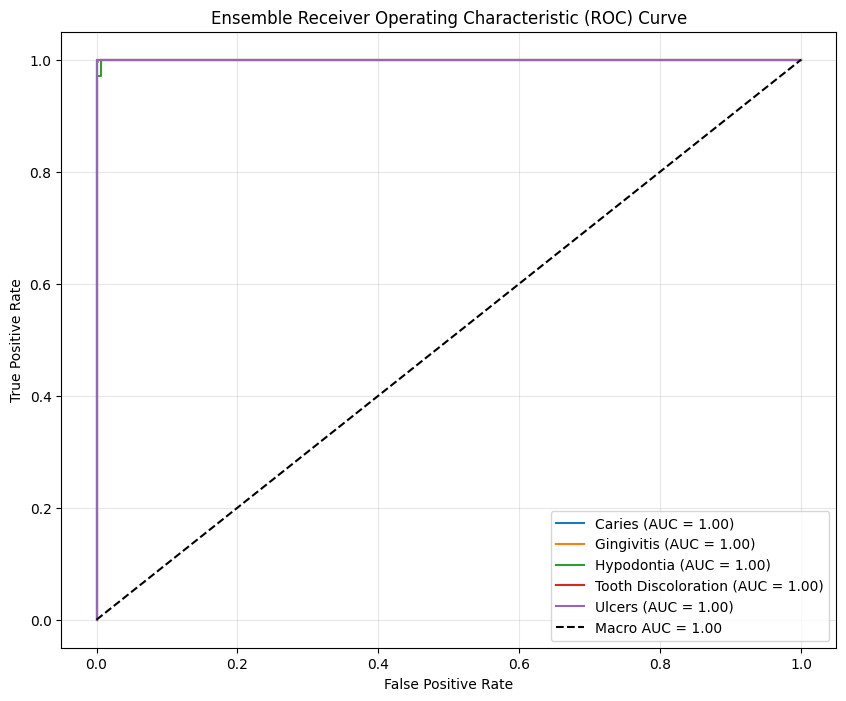

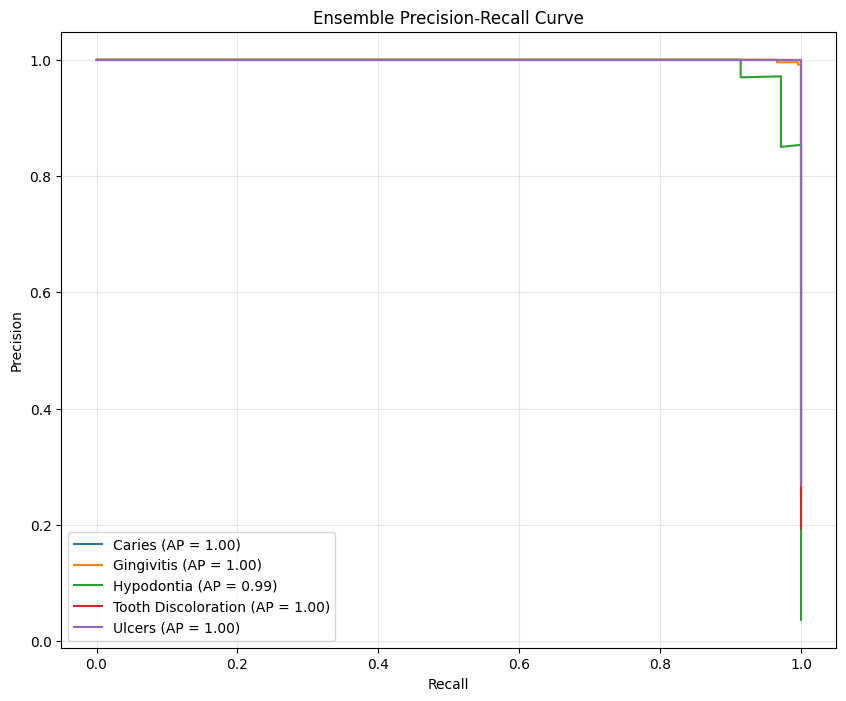

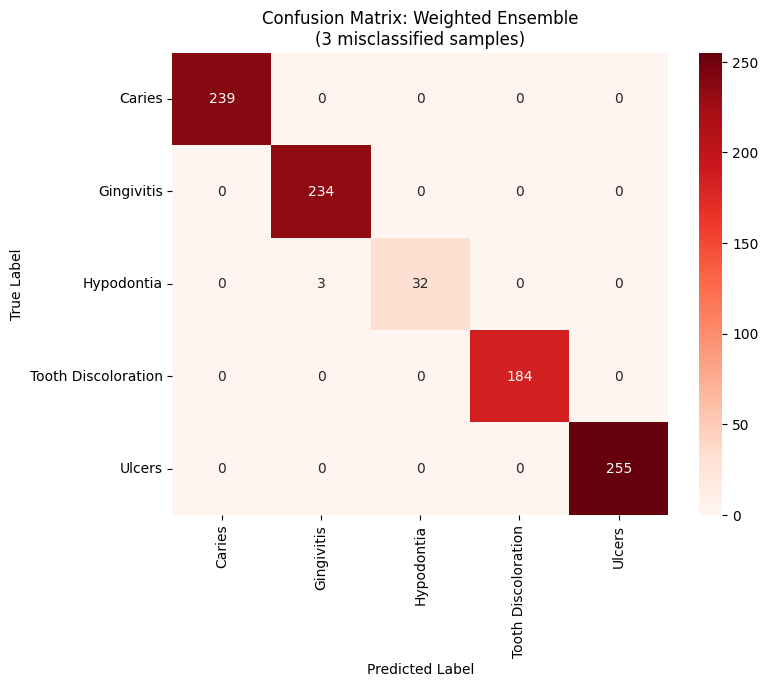



==================== LaTeX Table for Test Performance ====================
\begin{table}
\caption{Performance metrics on the test set (with TTA).}
\label{tab:model_performance}
\begin{tabular}{|l|r|rrrrrrrrrr|}
\toprule
Model & Test Loss & Accuracy & Balanced Acc & Precision & Recall & F1-Score & Specificity & Cohen's Kappa & MCC & Log Loss & Brier Score & AUC \\
\midrule
densenet121 & 0.00 & 99.26 & 98.42 & 99.26 & 99.26 & 99.26 & 99.82 & 0.99 & 0.99 & 0.10 & 0.00 & 1.00 \\
tf_efficientnetv2_s.in21k & 0.00 & 99.68 & 98.29 & 99.69 & 99.68 & 99.68 & 99.92 & 1.00 & 1.00 & 0.09 & 0.00 & 1.00 \\
resnet50 & 0.00 & 99.58 & 98.66 & 99.58 & 99.58 & 99.58 & 99.89 & 0.99 & 0.99 & 0.10 & 0.00 & 1.00 \\
inception_v3 & 0.01 & 97.57 & 96.51 & 97.61 & 97.57 & 97.57 & 99.37 & 0.97 & 0.97 & 0.19 & 0.01 & 1.00 \\
**Weighted Ensemble** & 0.00 & 99.68 & 98.29 & 99.69 & 99.68 & 99.68 & 99.92 & 1.00 & 1.00 & 0.11 & 0.00 & 1.00 \\
\bottomrule
\end{tabular}
\end{table}



==================== LaTeX Table fo

Extracting Features: 100%|██████████| 30/30 [00:03<00:00,  8.98it/s]


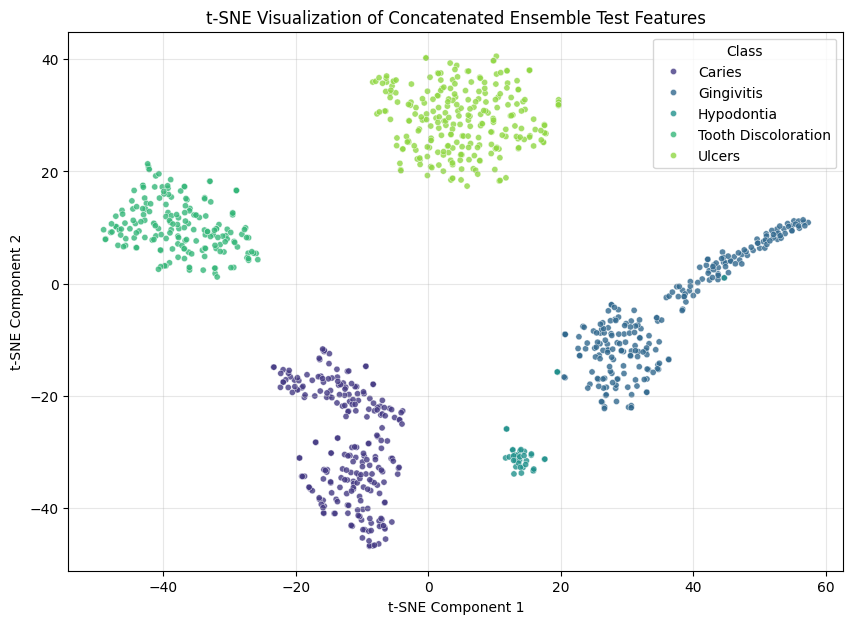


==================== Grad-CAM Visualization (Ensemble Average) ====================


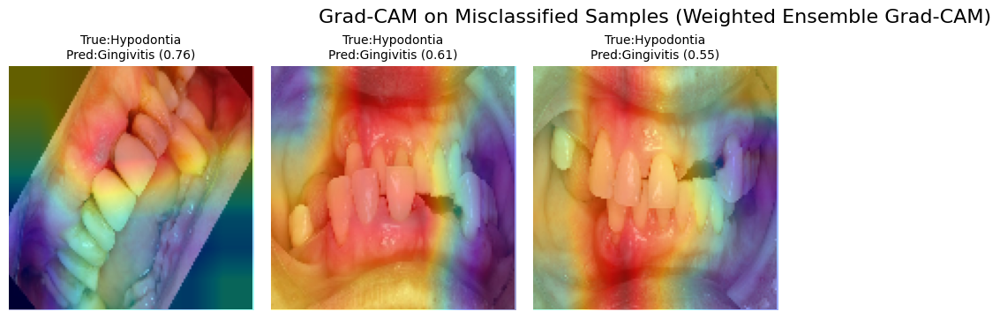

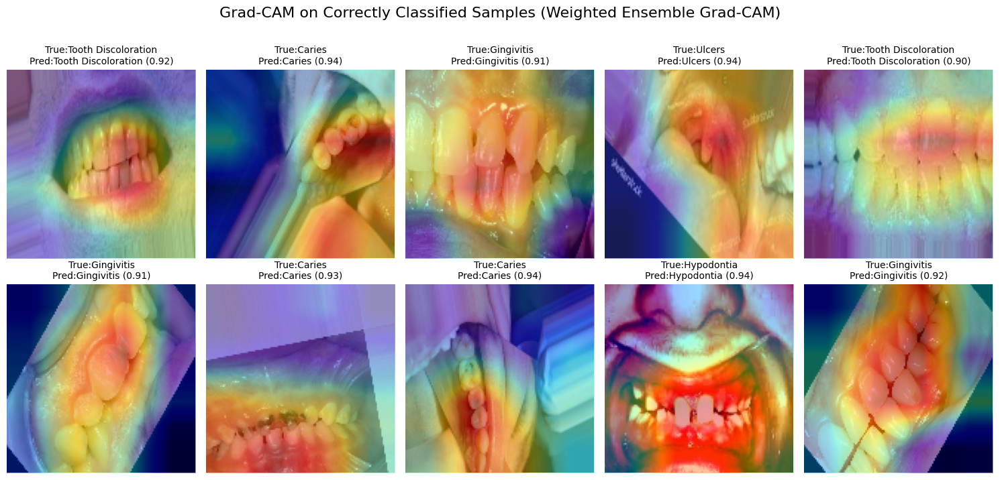


==================== Visualizing Correctly & Misclassified Samples (Ensemble) ====================
Plotting 3 misclassified images...


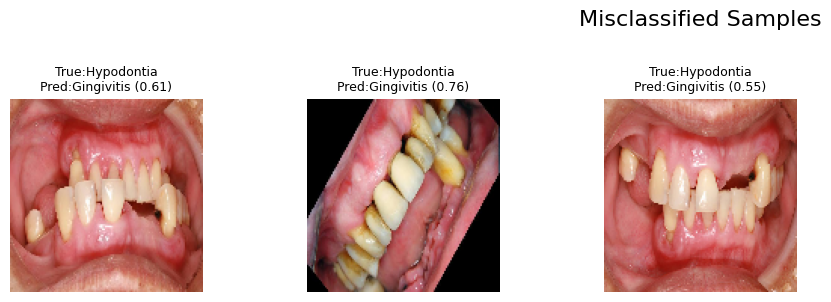

Plotting 20 correctly classified images...


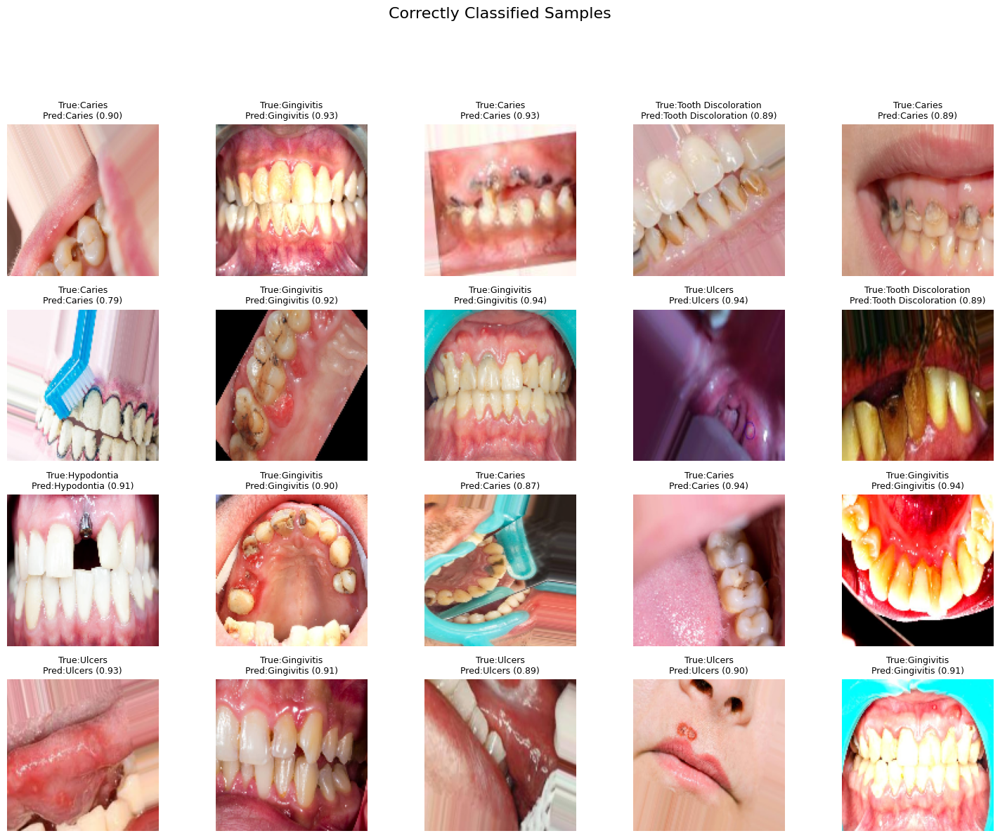

In [31]:
import os
import random
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import (accuracy_score, balanced_accuracy_score,
                             precision_score, recall_score, f1_score,
                             confusion_matrix, classification_report,
                             cohen_kappa_score, matthews_corrcoef, log_loss,
                             roc_curve, roc_auc_score, precision_recall_curve,
                             average_precision_score, brier_score_loss)
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize # Needed for multi-class AUC
from sklearn.manifold import TSNE
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import CosineAnnealingLR
import albumentations as A
from albumentations.pytorch import ToTensorV2
import timm
from tqdm import tqdm # Progress bar for loops

# ------------------------------------------------------------------
# 0‒ CONFIG & GLOBALS
# ------------------------------------------------------------------
SEED = 42 # Random seed for reproducibility
EPOCHS = 50# Number of training epochs
PATIENCE = 5 # Early stopping patience
BATCH = 32 # Batch size for DataLoader
LR = 5e-4 # Learning rate
IMG_SIZE = 128 # Image size for input to models
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu') # Determine compute device (GPU or CPU)
print(f"Using device: {DEVICE}")

# Base directory where the dataset (train, val, test subfolders) is located
DATASET_BASE_DIR = '/kaggle/working/dataset'
if not os.path.isdir(DATASET_BASE_DIR):
    print(f"Error: Specified DATASET_BASE_DIR not found at '{DATASET_BASE_DIR}'")
    print("Please check the path and ensure your dental dataset is mounted/located correctly.")

# Directory to save trained models
SAVE_DIR = '/content/gdrive/MyDrive/dental_models'
os.makedirs(SAVE_DIR, exist_ok=True) # Create save directory if it doesn't exist

# List of class names for the dental lesions dataset
CLASSES = ['Caries', 'Gingivitis', 'Hypodontia', 'Tooth Discoloration', 'Ulcers']
N_CLASSES = len(CLASSES) # Number of classes
MEAN, STD = (0.485, 0.456, 0.406), (0.229, 0.224, 0.225) # Normalization values (ImageNet stats)
TTA_STEPS = 5 # Number of Test Time Augmentation steps
LABEL_SMOOTHING = 0.1 # Label smoothing factor for Focal Loss

# Set seeds for reproducibility across different libraries and CUDA operations
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.backends.cudnn.deterministic = True # Ensures deterministic behavior for CuDNN
    torch.backends.cudnn.benchmark = False # Disables CuDNN auto-tuner for deterministic behavior

# ------------------------------------------------------------------
# 1‒ TRANSFORMS
# ------------------------------------------------------------------
# Training data augmentations using Albumentations
train_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE), # Resize images to a fixed size
    A.HorizontalFlip(p=0.5), # Random horizontal flip
    A.VerticalFlip(p=0.5), # Random vertical flip
    A.Rotate(limit=20, p=0.7), # Random rotation within limits
    A.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1, p=0.5), # Random color jitter
    A.CoarseDropout(p=0.5), # Randomly drops out rectangular regions (simulates occlusions)
    A.CLAHE(p=0.3), # Contrast Limited Adaptive Histogram Equalization
    A.ElasticTransform(alpha=1, sigma=50, p=0.3), # Elastic deformations to simulate variations
    A.Normalize(mean=MEAN, std=STD), # Normalize pixel values using pre-defined mean and std
    ToTensorV2(), # Convert the image to a PyTorch tensor
])

# Validation data transforms (only resize and normalize, no heavy augmentation)
val_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2(),
])

# Test Time Augmentation (TTA) transforms
# These are applied during inference to get multiple predictions for one image
# and then average them for a more robust prediction.
tta_transform = A.Compose([
    A.Resize(IMG_SIZE, IMG_SIZE),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Rotate(limit=15, p=0.5),
    A.Normalize(mean=MEAN, std=STD),
    ToTensorV2(),
])

# ------------------------------------------------------------------
# 2‒ DATASET
# ------------------------------------------------------------------
class MedicalDataset(Dataset):
    """
    Custom Dataset class for loading medical images from a directory structure
    where each subdirectory represents a class.
    """
    def __init__(self, source_dir, transform=None, is_tta=False):
        self.transform = transform
        self.is_tta = is_tta
        # Create a mapping from class name to numerical index
        self.class_to_idx = {cls: i for i, cls in enumerate(CLASSES)}
        self.samples = [] # List to store (image_path, label_index) tuples

        # Check if the source directory exists
        if not os.path.isdir(source_dir):
            print(f"Warning: Data directory '{source_dir}' not found. No samples will be loaded.")
            return

        # Iterate through each defined class to find images
        for lbl_idx, cls_name in enumerate(CLASSES):
            cls_path = os.path.join(source_dir, cls_name)
            if not os.path.isdir(cls_path):
                print(f"Warning: Class directory '{cls_name}' not found at '{cls_path}'. Skipping this class.")
                continue
            # Collect image files within the class directory
            for fn in os.listdir(cls_path):
                if fn.lower().endswith(('.png', '.jpg', '.jpeg')): # Check for common image extensions
                    self.samples.append((os.path.join(cls_path, fn), lbl_idx))

        if not self.samples:
            print(f"Warning: No valid image samples found in '{source_dir}'. Ensure images are present and correctly formatted.")

    def __len__(self):
        """Returns the total number of samples in the dataset."""
        return len(self.samples)

    def __getitem__(self, idx):
        """
        Retrieves an image and its corresponding label.
        Splies transformations and handles Test Time Augmentation (TTA).
        """
        path, label = self.samples[idx]
        # Open image using PIL, convert to RGB, and then to a NumPy array
        img = np.array(Image.open(path).convert('RGB'))

        if self.is_tta:
            # If TTA is enabled, apply the transform multiple times and stack the results
            images = [self.transform(image=img)['image'] for _ in range(TTA_STEPS)]
            return torch.stack(images), label
        if self.transform:
            # Apply standard transformations if not doing TTA
            img = self.transform(image=img)['image']
        return img, label



# ------------------------------------------------------------------
# 3‒ MODEL ARCHITECTURE with ATTENTION
# ------------------------------------------------------------------
# ------------------------------------------------------------------
# 3‒ MODEL ARCHITECTURE with ATTENTION (CNN-ONLY VERSION)
# ------------------------------------------------------------------
class SEBlock(nn.Module):
    """
    Squeeze-and-Excitation Block for CNN models.
    Enhances feature maps by modeling channel interdependencies.
    """
    def __init__(self, c, r=16):
        super().__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)  # Global average pooling
        self.excitation = nn.Sequential(
            nn.Linear(c, c // r, bias=False),    # Channel reduction
            nn.ReLU(inplace=True),
            nn.Linear(c // r, c, bias=False),    # Channel restoration
            nn.Sigmoid()                         # Channel weights
        )

    def forward(self, x):
        bs, c, _, _ = x.shape
        y = self.squeeze(x).view(bs, c)
        y = self.excitation(y).view(bs, c, 1, 1)
        return x * y.expand_as(x)  # Channel-wise scaling

class CustomModel(nn.Module):
    """
    Custom CNN model with SE attention and classification head.
    Supports: DenseNet121, EfficientNetV2, ResNet50, Inception_V3
    """
    def __init__(self, model_name='densenet121', pretrained=True):
        super().__init__()
        # Backbone initialization (CNN-only)
        self.model = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0,
            global_pool=''
        )

        # Get feature dimension (all CNNs output 4D: B, C, H, W)
        with torch.no_grad():
            dummy_input = torch.randn(2, 3, IMG_SIZE, IMG_SIZE)
            self.n_features = self.model(dummy_input).shape[1]

        # Attention and pooling
        self.attention = SEBlock(self.n_features)  # Always use SEBlock for CNNs
        self.pool = nn.AdaptiveAvgPool2d(1)       # Fixed-size output

        # Classifier head
        self.classifier = nn.Sequential(
            nn.Linear(self.n_features, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.6),
            nn.Linear(512, N_CLASSES)
        )

    def forward(self, x):
        features = self.model(x)
        features = self.attention(features)      # Apply SEBlock
        pooled = self.pool(features)            # B, C, 1, 1
        flattened = torch.flatten(pooled, 1)    # B, C
        return self.classifier(flattened)

    def extract_features(self, x):
        """Feature extraction for visualization"""
        features = self.model(x)
        features = self.attention(features)
        pooled = self.pool(features)
        return torch.flatten(pooled, 1)
# ------------------------------------------------------------------
# 4‒ LOSS FUNCTION
# ------------------------------------------------------------------
class FocalLoss(nn.Module):
    """
    Focal Loss implementation.
    It down-weights easy examples and focuses on hard, misclassified examples,
    which is beneficial for imbalanced datasets.
    """
    def __init__(self, alpha=.25, gamma=2, label_smoothing=0.0):
        super().__init__()
        self.alpha, self.gamma, self.smoothing = alpha, gamma, label_smoothing

    def forward(self, logits, targets):
        # Calculate standard Cross-Entropy Loss without reduction
        ce_loss = F.cross_entropy(logits, targets, reduction='none', label_smoothing=self.smoothing)
        # Calculate the probability of the true class
        pt = torch.exp(-ce_loss)
        # Apply the Focal Loss formula
        loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
        return loss.mean() # Return the mean loss over the batch

# ------------------------------------------------------------------
# 5‒ HELPER FUNCTIONS
# ------------------------------------------------------------------
def validate_epoch(model, loader, criterion, device, desc="Validation"):
    """
    Performs validation for one epoch and collects metrics.

    Args:
        model (nn.Module): The model to evaluate.
        loader (DataLoader): DataLoader for the validation/test set.
        criterion (nn.Module): Loss function for calculating validation loss.
        device (torch.device): The device (CPU/GPU) to run validation on.
        desc (str): Description for the tqdm progress bar.

    Returns:
        tuple: (average_loss, accuracy, true_labels_numpy, predicted_labels_numpy, probabilities_numpy)
    """
    model.eval() # Set model to evaluation mode
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], [] # Lists to store batch results

    # For validation, label smoothing should be typically off to get true loss
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)

    with torch.no_grad(): # Disable gradient calculations during evaluation
        for x, y in tqdm(loader, desc=desc):
            x, y = x.to(device), y.to(device) # Move data to device
            out = model(x) # Forward pass
            loss = val_criterion(out, y) # Calculate loss
            loss_sum += loss.item() * x.size(0) # Accumulate total loss

            prob = F.softmax(out, 1) # Convert raw outputs (logits) to probabilities
            pred = prob.argmax(1) # Get the predicted class (index of max probability)

            correct += (pred == y).sum().item() # Count correctly classified samples
            total += x.size(0) # Accumulate total samples processed

            true_labels_list.append(y.cpu()) # Store true labels
            predicted_labels_list.append(pred.cpu()) # Store predicted labels
            probabilities_list.append(prob.cpu()) # Store probabilities

    # Concatenate all collected tensors and convert to NumPy arrays for metric calculation
    avg_loss = loss_sum / total
    accuracy = correct / total
    true_labels_np = torch.cat(true_labels_list).numpy()
    predicted_labels_np = torch.cat(predicted_labels_list).numpy()
    probabilities_np = torch.cat(probabilities_list).numpy()

    return avg_loss, accuracy, true_labels_np, predicted_labels_np, probabilities_np

@torch.no_grad()
def validate_tta(model, loader, criterion, device):
    """
    Performs validation using Test Time Augmentation (TTA).
    Multiple augmented versions of each image are passed through the model,
    and their predictions are averaged to produce a more robust final prediction.
    """
    model.eval() # Set model to evaluation mode
    loss_sum, correct, total = 0., 0, 0
    true_labels_list, predicted_labels_list, probabilities_list = [], [], []

    # Validation criterion, typically without label smoothing
    val_criterion = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)

    for x_tta, y in tqdm(loader, desc="TTA Validation"):
        y = y.to(device) # Move true labels to device
        batch_size, n_tta, c, h, w = x_tta.shape
        # Reshape TTA input: (batch_size, n_tta_steps, channels, height, width)
        # to (batch_size * n_tta_steps, channels, height, width) for batch processing
        x_tta = x_tta.view(-1, c, h, w).to(device)
        out = model(x_tta) # Forward pass for all augmented images

        # Reshape output back and average probabilities across TTA steps for each original image
        prob_tta = F.softmax(out, 1).view(batch_size, n_tta, -1).mean(1)
        pred = prob_tta.argmax(1) # Get the final predicted class from averaged probabilities

        # To calculate loss with averaged probabilities, convert them back to "logits" using log
        # Clamp to prevent log(0) issues for very low probabilities
        avg_logits = torch.log(prob_tta.clamp(min=1e-9))
        loss = val_criterion(avg_logits, y) # Calculate loss based on averaged predictions

        loss_sum += loss.item() * batch_size # Accumulate total loss
        correct += (pred == y).sum().item() # Count correct predictions
        total += batch_size # Accumulate total original samples

        true_labels_list.append(y.cpu())
        predicted_labels_list.append(pred.cpu())
        probabilities_list.append(prob_tta.cpu())

    avg_loss = loss_sum / total
    accuracy = correct / total
    true_labels_np = torch.cat(true_labels_list).numpy()
    predicted_labels_np = torch.cat(predicted_labels_list).numpy()
    probabilities_np = torch.cat(probabilities_list).numpy()

    return avg_loss, accuracy, true_labels_np, predicted_labels_np, probabilities_np

def train_model(model, name, train_loader, val_loader, criterion, device):
    """
    Trains the given model for a specified number of epochs with early stopping.

    Args:
        model (nn.Module): The deep learning model to train.
        name (str): A string identifier for the model (used for saving checkpoints).
        train_loader (DataLoader): DataLoader for the training dataset.
        val_loader (DataLoader): DataLoader for the validation dataset.
        criterion (nn.Module): The loss function (e.g., FocalLoss).
        device (torch.device): The device (CPU/GPU) to perform training on.

    Returns:
        tuple: (history_dict, average_runtime_per_epoch)
            history_dict (dict): Contains training and validation loss/accuracy per epoch.
            average_runtime_per_epoch (float): Average time taken per epoch in seconds.
    """
    optimizer = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4) # AdamW optimizer with weight decay
    scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6) # Cosine annealing LR scheduler
    scaler = torch.amp.GradScaler(enabled=(device.type == 'cuda')) # GradScaler for mixed precision training (if CUDA available)

    best_val_loss = float('inf') # Initialize best validation loss for saving checkpoint
    patience_counter = 0 # Counter for early stopping

    history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []} # To log training progress

    print(f"\n=== Starting training for {name} for {EPOCHS} epochs ===")
    train_start_time = time.time() # Record start time for total training duration

    for epoch in range(1, EPOCHS + 1):
        model.train() # Set model to training mode
        running_loss = 0.0
        running_correct = 0
        total_samples = 0

        # Iterate over the training data
        for x, y in tqdm(train_loader, desc=f"Epoch {epoch}/{EPOCHS} (Train)"):
            x, y = x.to(device), y.to(device) # Move inputs and labels to the specified device

            optimizer.zero_grad(set_to_none=True) # Zero the gradients before each batch

            # Perform forward pass with automatic mixed precision (if enabled)
            with torch.amp.autocast(device_type=device.type, enabled=(device.type == 'cuda')):
                out = model(x) # Model prediction (logits)
                loss = criterion(out, y) # Calculate loss

            scaler.scale(loss).backward() # Scale the loss and perform backward pass
            scaler.step(optimizer) # Update model parameters
            scaler.update() # Update the scale for the next iteration

            running_loss += loss.item() * x.size(0) # Accumulate batch loss
            correct_preds = (out.argmax(1) == y).sum().item() # Count correct predictions
            running_correct += correct_preds
            total_samples += x.size(0) # Accumulate total samples processed

        train_epoch_loss = running_loss / total_samples # Calculate average training loss for the epoch
        train_epoch_acc = running_correct / total_samples # Calculate average training accuracy for the epoch

        # Evaluate model on the validation set
        val_loss, val_acc, _, _, _ = validate_epoch(model, val_loader, criterion, device, desc=f"Epoch {epoch}/{EPOCHS} (Val)")

        # Store epoch results in history
        history['train_loss'].append(train_epoch_loss)
        history['train_acc'].append(train_epoch_acc)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(val_acc)

        # Print epoch summary
        print(f"[{name}] Ep{epoch:02d} | Train Loss: {train_epoch_loss:.4f} Acc: {train_epoch_acc:.2%} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.2%}")

        scheduler.step() # Update learning rate based on the scheduler

        # Early stopping logic: Save best model and track patience
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            patience_counter = 0 # Reset patience counter
            save_path = os.path.join(SAVE_DIR, f'best_model_{name}.pth')
            torch.save(model.state_dict(), save_path) # Save the model's state dictionary
            print(f"   -> Model saved to {save_path} (Validation loss improved)")
        else:
            patience_counter += 1
            if patience_counter >= PATIENCE:
                print(f"   -> Early stopping triggered for {name} after {epoch} epochs.")
                break # Stop training if patience runs out

    train_end_time = time.time() # Record end time of training
    total_training_time = train_end_time - train_start_time
    epochs_completed = len(history['train_loss'])
    avg_runtime_per_epoch = total_training_time / epochs_completed if epochs_completed > 0 else 0

    return history, avg_runtime_per_epoch

def compute_macro_specificity(cm: np.ndarray) -> float:
    """
    Computes macro-averaged specificity from a confusion matrix.
    Specificity for a class is defined as True Negatives / (True Negatives + False Positives).
    """
    n_classes = cm.shape[0]
    total_samples = cm.sum()
    specificities = []
    for i in range(n_classes):
        true_positives = cm[i, i]
        # False positives for class i: sum of column i minus true positives for class i
        false_positives = cm[:, i].sum() - true_positives
        # False negatives for class i: sum of row i minus true positives for class i
        false_negatives = cm[i, :].sum() - true_positives
        # True negatives for class i: total samples minus (TP + FP + FN) for class i
        true_negatives = total_samples - (true_positives + false_positives + false_negatives)

        denominator = true_negatives + false_positives
        specificity_i = true_negatives / denominator if denominator > 0 else 0.0 # Handle division by zero
        specificities.append(specificity_i)
    return float(np.mean(specificities)) # Return the average specificity across all classes

def plot_roc(y_true, y_prob, title_prefix=""):
    """
    Plots the Receiver Operating Characteristic (ROC) curve.
    Handles both binary and multi-class classification.
    For multi-class, it plots one-vs-rest ROC curves and calculates macro-average AUC.
    """
    plt.figure(figsize=(10, 8))
    if N_CLASSES == 2:
        # Binary classification: plot ROC for the positive class
        fpr, tpr, _ = roc_curve(y_true, y_prob[:, 1])
        roc_auc = roc_auc_score(y_true, y_prob[:, 1])
        plt.plot(fpr, tpr, label=f'{CLASSES[1]} (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], 'k--', label='Chance Line') # Diagonal chance line
    else:
        # Multi-class classification: binarize true labels and plot one-vs-rest ROCs
        y_true_binarized = label_binarize(y_true, classes=np.arange(N_CLASSES))
        for i in range(N_CLASSES):
            fpr, tpr, _ = roc_curve(y_true_binarized[:, i], y_prob[:, i])
            roc_auc = roc_auc_score(y_true_binarized[:, i], y_prob[:, i])
            plt.plot(fpr, tpr, label=f'{CLASSES[i]} (AUC = {roc_auc:.2f})')
        # Calculate and plot macro-average AUC
        macro_auc = roc_auc_score(y_true_binarized, y_prob, multi_class="ovo", average="macro")
        plt.plot([0, 1], [0, 1], 'k--', label=f'Macro AUC = {macro_auc:.2f}')

    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'{title_prefix} Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc='lower right')
    plt.grid(alpha=.3)
    plt.show()

def plot_prc(y_true, y_prob, title_prefix=""):
    """
    Plots the Precision-Recall Curve (PRC).
    Handles both binary and multi-class classification.
    For multi-class, it plots one-vs-rest PRCs for each class.
    """
    plt.figure(figsize=(10, 8))
    if N_CLASSES == 2:
        # Binary classification: plot PRC for the positive class
        precision, recall, _ = precision_recall_curve(y_true, y_prob[:, 1])
        ap = average_precision_score(y_true, y_prob[:, 1])
        plt.plot(recall, precision, label=f'{CLASSES[1]} (AP = {ap:.2f})')
    else:
        # Multi-class classification: plot one-vs-rest PRCs for each class
        for i in range(N_CLASSES):
            # For each class, treat it as positive and others as negative
            precision, recall, _ = precision_recall_curve(y_true == i, y_prob[:, i])
            ap = average_precision_score(y_true == i, y_prob[:, i])
            plt.plot(recall, precision, label=f'{CLASSES[i]} (AP = {ap:.2f})')

    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'{title_prefix} Precision-Recall Curve')
    plt.legend(loc='lower left')
    plt.grid(alpha=.3)
    plt.show()

def plot_cm(y_true, y_pred, model_name=""):
    """
    Plots the Confusion Matrix using Seaborn heatmap.
    Visualizes the performance of a classification model.
    """
    cm = confusion_matrix(y_true, y_pred)
    misclassified_count = cm.sum() - np.diag(cm).sum() # Calculate total misclassified samples
    title = f'Confusion Matrix: {model_name}\n({misclassified_count} misclassified samples)'
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Reds', xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(title)
    plt.show()

def get_target_layer(model_instance, model_name):
    """
    Identifies and returns the appropriate target layer within the model's backbone
    for Grad-CAM visualization. This layer is typically the last convolutional layer.
    """
    model_backbone = model_instance.model # Get the timm model backbone
    if 'densenet' in model_name:
        return model_backbone.features.denseblock4.denselayer16.conv2
    elif 'efficientnet' in model_name:
        return model_backbone.conv_head
    elif 'swin' in model_name:
        # For Swin transformers, target the last block's layer
        return model_backbone.layers[-1].blocks[-1]
    elif 'resnet' in model_name:
        return model_backbone.layer4[-1]
    elif 'inception' in model_name:
        return model_backbone.Mixed_7c
    elif 'vit' in model_name:
        # For Vision Transformers, a common target is the last attention block
        return model_backbone.blocks[-1].mlp.fc2 # Example for a typical ViT
    try:
        # Fallback: Iterate backwards through modules to find the last Conv2d layer
        for module in reversed(list(model_backbone.modules())):
            if isinstance(module, nn.Conv2d):
                print(f"Using fallback: Found last Conv2d for {model_name} as target layer.")
                return module
    except Exception as e:
        print(f"Error finding fallback target layer for {model_name}: {e}")
    print(f"Warning: Could not determine a suitable target layer for Grad-CAM for model '{model_name}'.")
    return None

def compute_gradcam(model, target_layer, input_tensor, class_idx, model_name):
    """
    Computes the Grad-CAM (Gradient-weighted Class Activation Mapping) heatmap.
    This heatmap highlights the regions in the input image that are most important
    for the model's prediction of a specific class.
    """
    if target_layer is None:
        print(f"Error: Target layer is None for Grad-CAM ({model_name}). Returning blank heatmap.")
        return np.zeros((IMG_SIZE, IMG_SIZE))

    model.eval() # Set the model to evaluation mode

    feature_maps = [] # Stores feature maps from the target layer
    gradients = [] # Stores gradients flowing back to the target layer

    # Define a forward hook to capture the output (feature map) of the target layer
    def forward_hook(module, input, output):
        feature_maps.append(output.detach()) # Detach to prevent gradients from flowing through here

    # Define a backward hook to capture the gradients with respect to the output of the target layer
    def backward_hook(module, grad_input, grad_output):
        gradients.append(grad_output[0].detach()) # grad_output[0] is the gradient for the output

    # Register the hooks to the target layer
    hook_fwd = target_layer.register_forward_hook(forward_hook)
    hook_bwd = target_layer.register_full_backward_hook(backward_hook)

    output = model(input_tensor) # Perform a forward pass
    score = output[:, class_idx].sum() # Get the score of the predicted class (sum to handle batch size 1)

    model.zero_grad() # Clear existing gradients
    score.backward(retain_graph=True) # Perform a backward pass to compute gradients.
                                     # retain_graph=True is important if you plan to do more backward passes.

    # Remove hooks to clean up and prevent memory leaks
    hook_fwd.remove()
    hook_bwd.remove()

    if not feature_maps or not gradients:
        print(f"Warning: Grad-CAM hooks failed for {model_name}. Returning blank heatmap.")
        return np.zeros((IMG_SIZE, IMG_SIZE))

    activations = feature_maps[0] # Get the captured activations
    grads = gradients[0] # Get the captured gradients

    if 'swin' in model_name or 'vit' in model_name:
        # Special handling for transformer-based models where features are usually 1D sequences
        cam = grads.mean(dim=1).relu() # Average gradients over the feature dimension, apply ReLU
        num_patches = int(np.sqrt(cam.shape[1])) # Calculate grid size for reconstruction
        if num_patches * num_patches != cam.shape[1]:
            print(f"Warning: Transformer sequence length {cam.shape[1]} is not a perfect square for Grad-CAM visualization. Reshaping might be imperfect.")
            cam = cam[:, :num_patches*num_patches] # Truncate if not a perfect square
        cam = cam.reshape(cam.shape[0], num_patches, num_patches).unsqueeze(1) # Reshape to 2D grid and add channel dim
    else:
        # For CNNs: Calculate channel-wise weights (global average of gradients)
        weights = grads.mean(dim=[2, 3], keepdim=True) # Average gradients spatially
        # Multiply weights by activations and sum across channels, then apply ReLU
        cam = (weights * activations).sum(dim=1, keepdim=True).relu()

    # Interpolate the CAM to the original image size
    cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
    cam = cam.squeeze().cpu().numpy() # Remove singleton dimensions, move to CPU, convert to NumPy

    # Normalize the heatmap to a 0-1 range for visualization
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-9) # Add small epsilon to avoid division by zero if max==min

    return cam

def denormalize(img_tensor):
    """
    Denormalizes a tensor image from its normalized state (using mean and std)
    back to the original pixel value range (0-1), suitable for display.
    """
    # Reshape mean and std tensors to match (C, 1, 1) for broadcasting
    mean = torch.tensor(MEAN).view(3, 1, 1).to(img_tensor.device)
    std = torch.tensor(STD).view(3, 1, 1).to(img_tensor.device)

    if img_tensor.dim() == 4: # If batch dimension is present (e.g., [1, C, H, W])
        img_tensor = img_tensor.squeeze(0) # Remove the batch dimension

    # Denormalize the image: (normalized_value * std) + mean
    img = img_tensor.cpu() * std.cpu() + mean.cpu() # Perform operations on CPU after moving tensors there

    # Permute dimensions from (C, H, W) to (H, W, C) for Matplotlib display
    # Clamp values to [0, 1] to ensure valid pixel range
    return img.permute(1, 2, 0).clamp(0, 1).numpy()

def plot_misclassified_images(dataset, true_labels, predicted_labels, probabilities, classes, num_cols=5):
    """
    Plots a grid of images that were misclassified by the model.
    Displays the true label, predicted label, and prediction confidence.
    """
    idxs = np.where(true_labels != predicted_labels)[0] # Get indices of misclassified samples
    if len(idxs) == 0:
        print("No misclassified images to display.")
        return

    print(f"Plotting {len(idxs)} misclassified images...")
    display_idxs = idxs # All misclassified images will be displayed

    rows = (len(display_idxs) + num_cols - 1) // num_cols # Calculate number of rows for the plot grid
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    axes = axes.flatten() # Flatten the axes array for easier iteration

    for i, idx in enumerate(display_idxs):
        img_tensor, true_lbl_idx = dataset[idx] # Get the image tensor and its true label
        ax = axes[i]
        ax.imshow(denormalize(img_tensor)) # Display the denormalized image
        ax.axis('off') # Turn off axis ticks and labels

        pred_lbl_idx = predicted_labels[idx] # Get the predicted label
        confidence = probabilities[idx, pred_lbl_idx] # Get the confidence for the predicted class

        ax.set_title(f"True:{classes[true_lbl_idx]}\nPred:{classes[pred_lbl_idx]} ({confidence:.2f})", fontsize=9)

    # Hide any unused subplots if the number of misclassified images is not a multiple of num_cols
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Misclassified Samples", fontsize=16, y=1.02) # Main title for the figure
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

def plot_correctly_classified_images(dataset, true_labels, predicted_labels, probabilities, classes, n_display=20, num_cols=5):
    """
    Plots a random sample of correctly classified images.
    Displays the true label (which is also the predicted label) and confidence.
    """
    idxs = np.where(true_labels == predicted_labels)[0] # Get indices of correctly classified samples
    if len(idxs) == 0:
        print("No correctly classified images to display.")
        return

    n_to_plot = min(n_display, len(idxs)) # Determine how many correctly classified images to plot
    print(f"Plotting {n_to_plot} correctly classified images...")
    sampled_idxs = random.sample(list(idxs), n_to_plot) # Randomly sample from correctly classified images

    rows = (len(sampled_idxs) + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    axes = axes.flatten()

    for i, idx in enumerate(sampled_idxs):
        img_tensor, true_lbl_idx = dataset[idx]
        ax = axes[i]
        ax.imshow(denormalize(img_tensor))
        ax.axis('off')

        confidence = probabilities[idx, true_lbl_idx] # Confidence for the correct class
        ax.set_title(f"True:{classes[true_lbl_idx]}\nPred:{classes[true_lbl_idx]} ({confidence:.2f})", fontsize=9)

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.suptitle("Correctly Classified Samples", fontsize=16, y=1.02)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

@torch.no_grad()
def extract_features(model, loader, device):
    """
    Extracts high-level features from the model's feature extraction part
    for all samples in a given DataLoader.
    Used for dimensionality reduction visualizations like t-SNE.
    """
    model.eval() # Set model to evaluation mode
    all_features, all_labels = [], []
    for x, y in tqdm(loader, desc="Extracting Features"):
        x = x.to(device) # Move input to device
        features = model.extract_features(x) # Get features from the model
        features = features.cpu().numpy() # Move features to CPU and convert to NumPy
        all_features.append(features)
        all_labels.append(y.cpu().numpy())
    return np.concatenate(all_features, axis=0), np.concatenate(all_labels, axis=0)

def plot_sample_images(dataset, title, n_per_class=5, num_cols=5):
    """
    Plots a selection of sample images from the dataset, ensuring
    at least `n_per_class` images are shown for each class if available.
    """
    all_images_to_plot = []
    for class_idx in range(N_CLASSES):
        class_samples = [s for s in dataset.samples if s[1] == class_idx]
        if len(class_samples) < n_per_class:
            print(f"Warning: Not enough samples ({len(class_samples)}) for class '{CLASSES[class_idx]}'. Displaying all available for this class.")
            all_images_to_plot.extend(class_samples)
        else:
            all_images_to_plot.extend(random.sample(class_samples, n_per_class))

    if not all_images_to_plot:
        print(f"No samples found for '{title}'. Skipping plot.")
        return

    # Sort images by label for a more organized display
    all_images_to_plot.sort(key=lambda x: x[1])

    total_images_to_plot = len(all_images_to_plot)
    rows = (total_images_to_plot + num_cols - 1) // num_cols
    fig, axes = plt.subplots(rows, num_cols, figsize=(15, 3 * rows))
    axes = axes.flatten() # Flatten for easy iteration

    fig.suptitle(title, fontsize=16, y=1.02) # Set the main title

    for i, (path, lbl) in enumerate(all_images_to_plot):
        ax = axes[i]
        img = np.array(Image.open(path).convert('RGB')) # Load image for display
        ax.imshow(img)
        ax.set_title(f"Class: {CLASSES[lbl]}")
        ax.axis('off')

    # Hide any remaining empty subplots
    for j in range(total_images_to_plot, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout
    plt.show()

# ------------------------------------------------------------------
# 6‒ MAIN EXECUTION SCRIPT
# ------------------------------------------------------------------
def main():
    # --- 1. Data Setup ---
    os.makedirs(SAVE_DIR, exist_ok=True) # Ensure the directory for saving models exists

    # Define paths for train, validation, and test directories based on DATASET_BASE_DIR
    train_data_dir = os.path.join(DATASET_BASE_DIR, 'train')
    val_data_dir = os.path.join(DATASET_BASE_DIR, 'val')
    test_data_dir = os.path.join(DATASET_BASE_DIR, 'test')

    # Bar plot visualization of dataset distribution across train, val, test splits
    class_split_counts = {class_name: {'train': 0, 'val': 0, 'test': 0} for class_name in CLASSES}

    def count_images(base_dir, class_name):
        """Helper to count images in a given split directory for a class."""
        counts = {}
        for split in ['train', 'val', 'test']:
            split_dir = os.path.join(base_dir, split, class_name)
            if os.path.exists(split_dir):
                counts[split] = len(os.listdir(split_dir)) # Count files in directory
            else:
                counts[split] = 0
        return counts

    # Populate class split counts
    for class_name in CLASSES:
        class_split_counts[class_name] = count_images(DATASET_BASE_DIR, class_name)

    labels = CLASSES
    train_counts = [class_split_counts[class_name]['train'] for class_name in CLASSES]
    val_counts = [class_split_counts[class_name]['val'] for class_name in CLASSES]
    test_counts = [class_split_counts[class_name]['test'] for class_name in CLASSES]

    x = range(len(CLASSES)) # X-axis positions for bars

    fig, ax = plt.subplots(figsize=(10, 6))
    # Plot stacked bar chart for class distribution
    bar1 = ax.bar(x, train_counts, label='Train', color='skyblue')
    bar2 = ax.bar(x, val_counts, bottom=train_counts, label='Val', color='lightgreen')
    bar3 = ax.bar(x, test_counts, bottom=[i+j for i,j in zip(train_counts, val_counts)], label='Test', color='lightcoral')

    ax.set_xlabel('Classes')
    ax.set_ylabel('Number of Images')
    ax.set_title('Number of Images per Class (Train, Val, Test)')
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=45, ha='right') # Rotate labels for readability
    ax.legend()

    # Add count labels on the bars
    for bar in bar1:
        height = bar.get_height()
        if height > 0:
            ax.text(bar.get_x() + bar.get_width()/2, height / 2, f'{int(height)}',
                            ha='center', va='center', color='black', fontsize=8)

    for bar in bar2:
        height = bar.get_height()
        if height > 0:
            y_pos = bar.get_y() + height / 2
            ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                            ha='center', va='center', color='black', fontsize=8)

    for bar in bar3:
        height = bar.get_height()
        if height > 0:
            y_pos = bar.get_y() + height / 2
            ax.text(bar.get_x() + bar.get_width()/2, y_pos, f'{int(height)}',
                            ha='center', va='center', color='black', fontsize=8)

    plt.tight_layout()
    plt.show()

    # Verify that the necessary data directories exist before proceeding
    if not (os.path.isdir(train_data_dir) and os.path.isdir(val_data_dir) and os.path.isdir(test_data_dir)):
        print(f"Error: One or more data directories not found under '{DATASET_BASE_DIR}'.")
        print("Please ensure your dataset is structured correctly with 'train', 'val', 'test' subdirectories, each containing class folders.")
        return

    # Initialize datasets using the MedicalDataset class and appropriate transforms
    train_dataset = MedicalDataset(train_data_dir, transform=train_transform)
    val_dataset = MedicalDataset(val_data_dir, transform=val_transform)
    test_dataset_tta = MedicalDataset(test_data_dir, transform=tta_transform, is_tta=True)
    test_dataset = MedicalDataset(test_data_dir, transform=val_transform) # For non-TTA evaluations and visualizations
    eval_train_dataset = MedicalDataset(train_data_dir, transform=val_transform) # For evaluating training set performance

    # Crucial check: if any dataset is empty, stop execution as training/evaluation won't work
    if not train_dataset.samples or not val_dataset.samples or not test_dataset.samples:
        print("Halting execution: One or more datasets (train, val, or test) are empty. Please check data paths and content.")
        return

    # Create DataLoaders for efficient batching and multi-threading
    # num_workers=2 is a common choice for data loading in PyTorch
    train_loader = DataLoader(train_dataset, batch_size=BATCH, shuffle=True, num_workers=2, pin_memory=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)
    # TTA loader often uses a smaller batch size because each item generates multiple augmented images
    test_loader_tta = DataLoader(test_dataset_tta, batch_size=BATCH // 2, shuffle=False, num_workers=2, pin_memory=True)
    test_loader = DataLoader(test_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)
    eval_train_loader = DataLoader(eval_train_dataset, batch_size=BATCH, shuffle=False, num_workers=2, pin_memory=True)

    print(f"\n--- Dataset Statistics ---")
    print(f"Classes identified: {CLASSES}")
    print(f"Number of training samples: {len(train_dataset)}")
    print(f"Number of validation samples: {len(val_dataset)}")
    print(f"Number of testing samples: {len(test_dataset)}")
    print("-" * 25)

    # Plot a few sample images from the training set
    plot_sample_images(train_dataset, "Sample Training Images (5 per Class)", n_per_class=5)

    print("\n=== Plotting Histogram of Pixel Intensities (Training Set) ===")
    plt.figure(figsize=(12, 6))
    for i, cls_name in enumerate(CLASSES):
        # Sample up to 100 images per class for intensity analysis to keep it fast
        imgs_for_intensity = [path for path, lbl in train_dataset.samples if lbl == i][:100]
        intensities = [np.array(Image.open(p).convert('L')).mean() for p in imgs_for_intensity]
        if intensities: # Only plot if there are intensities to plot
            sns.histplot(intensities, bins=30, kde=True, label=cls_name)
    plt.title('Histogram of Mean Pixel Intensities by Class (Training Set)')
    plt.xlabel('Mean Pixel Intensity'); plt.ylabel('Frequency'); plt.legend(); plt.show()

    # --- 2. Model Training ---
    criterion = FocalLoss(label_smoothing=LABEL_SMOOTHING) # Initialize the Focal Loss
    # Define the models to be trained and ensembled
    model_names = ['densenet121', 'tf_efficientnetv2_s.in21k', 'resnet50', 'inception_v3']
    histories = {} # Dictionary to store training history for each model
    runtimes = {} # Dictionary to store average runtime per epoch for each model

    for model_name in model_names:
        model = CustomModel(model_name=model_name, pretrained=True).to(DEVICE) # Initialize model
        history, avg_runtime = train_model(model, model_name, train_loader, val_loader, criterion, DEVICE) # Train the model
        histories[model_name] = history
        runtimes[model_name] = avg_runtime

    # --- 3. Plotting Training Curves ---
    print("\n=== Plotting Individual Model Learning Curves ===")
    for model_name, history in histories.items():
        if not history['train_loss']: # Check if training history exists for the model
            print(f"No history data for {model_name}. Skipping plot.")
            continue
        epochs_ran = len(history['train_loss'])
        x_axis = np.arange(1, epochs_ran + 1)
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5)) # Create two subplots for loss and accuracy
        fig.suptitle(f'Training History: {model_name}', fontsize=16)

        # Plot Loss Curves
        ax1.plot(x_axis, history['train_loss'], 'o-', label='Train Loss', color='blue')
        ax1.plot(x_axis, history['val_loss'], 'o-', label='Val Loss', color='orange')
        ax1.set_xlabel('Epoch'); ax1.set_ylabel('Loss'); ax1.legend(); ax1.grid(True, alpha=0.3)
        ax1.set_title('Loss')

        # Plot Accuracy Curves
        ax2.plot(x_axis, [acc * 100 for acc in history['train_acc']], 'o-', label='Train Acc', color='blue')
        ax2.plot(x_axis, [acc * 100 for acc in history['val_acc']], 'o-', label='Val Acc', color='orange')
        ax2.set_xlabel('Epoch'); ax2.set_ylabel('Accuracy (%)'); ax2.legend(); ax2.grid(True, alpha=0.3)
        ax2.set_title('Accuracy')

        plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout
        plt.show()

    # --- 4. Individual Model Evaluation & Ensemble Preparation ---
    print("\n" + "="*20 + " Evaluating Individual Models for Ensemble Weights " + "="*20)
    # Check if any trained model checkpoints exist to proceed with evaluation
    model_files_exist = any(os.path.exists(os.path.join(SAVE_DIR, f'best_model_{m}.pth')) for m in model_names)
    if not model_files_exist:
        print(f"No trained model checkpoints found in '{SAVE_DIR}'. Halting evaluation.")
        return

    individual_results = {} # To store evaluation results for each model
    all_train_probs, all_val_probs, all_test_probs = [], [], [] # To collect probabilities for ensemble
    train_true, val_true, test_true = None, None, None # To store true labels (should be consistent across models)
    val_accuracies_for_weights = [] # To store validation accuracies, used for ensemble weighting

    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if not os.path.exists(model_path):
            print(f"Skipping evaluation for {model_name}: Model checkpoint not found at {model_path}.")
            val_accuracies_for_weights.append(0) # Assign zero weight if model not available
            continue

        print(f"\n--- Evaluating Individual Model: {model_name} ---")
        model = CustomModel(model_name=model_name, pretrained=False).to(DEVICE) # Initialize model without pre-training
        model.load_state_dict(torch.load(model_path, map_location=DEVICE)) # Load trained weights
        model.eval() # Set to evaluation mode

        # Perform evaluation on train, validation, and test sets
        # Note: y_train_temp, y_val_temp, y_test_temp will be the same across models
        # prob_temp variables are the predicted probabilities for each set
        _, _, y_train_temp, _, train_prob_temp = validate_epoch(model, eval_train_loader, criterion, DEVICE, desc=f"{model_name} Train Eval")
        val_loss_temp, val_acc_temp, y_val_temp, _, val_prob_temp = validate_epoch(model, val_loader, criterion, DEVICE, desc=f"{model_name} Val Eval")
        test_loss_temp, test_acc_temp, y_test_temp, test_pred_temp, test_prob_temp = validate_tta(model, test_loader_tta, criterion, DEVICE)

        # Store true labels once (they are constant for all models)
        if train_true is None: train_true = y_train_temp
        if val_true is None: val_true = y_val_temp
        if test_true is None: test_true = y_test_temp

        # Collect probabilities from each model for ensemble averaging
        all_train_probs.append(train_prob_temp)
        all_val_probs.append(val_prob_temp)
        all_test_probs.append(test_prob_temp)
        val_accuracies_for_weights.append(val_acc_temp) # Store validation accuracy for ensemble weighting

        print(f"   -> Test Accuracy (with TTA): {test_acc_temp:.2%}")
        plot_cm(test_true, test_pred_temp, model_name) # Plot confusion matrix for individual model

        # Calculate additional metrics for individual models
        cm_individual = confusion_matrix(test_true, test_pred_temp)
        if N_CLASSES == 2:
            auc_ind = roc_auc_score(test_true, test_prob_temp[:, 1])
        else:
            # Binarize true labels for multi-class AUC calculation (one-vs-one macro average)
            y_test_binarized = label_binarize(test_true, classes=np.arange(N_CLASSES))
            auc_ind = roc_auc_score(y_test_binarized, test_prob_temp, multi_class="ovo", average="macro")

        # Brier Score is calculated per class and then averaged
        brier_ind = np.mean([brier_score_loss((test_true == i).astype(int), test_prob_temp[:, i]) for i in range(N_CLASSES)])

        # Calculate MCC and Log Loss for the individual model
        mcc_ind = matthews_corrcoef(test_true, test_pred_temp)
        logloss_ind = log_loss(test_true, test_prob_temp)

        # Store all calculated metrics in the individual_results dictionary
        individual_results[model_name] = {
            'Test Loss': float(test_loss_temp),
            'Accuracy': accuracy_score(test_true, test_pred_temp),
            'Balanced Acc': balanced_accuracy_score(test_true, test_pred_temp),
            'Precision': precision_score(test_true, test_pred_temp, average='weighted'),
            'Recall': recall_score(test_true, test_pred_temp, average='weighted'),
            'F1-Score': f1_score(test_true, test_pred_temp, average='weighted'),
            'Specificity': compute_macro_specificity(cm_individual),
            "Cohen's Kappa": cohen_kappa_score(test_true, test_pred_temp),
            "MCC": mcc_ind,    # Matthews Correlation Coefficient
            "Log Loss": logloss_ind, # Logarithmic Loss
            "Brier Score": brier_ind,
            "AUC": auc_ind
        }

    # --- 5. Weighted Ensemble Analysis ---
    if not all_test_probs:
        print("No model outputs collected for ensemble. Please check previous steps.")
        return

    print("\n" + "="*20 + " Final Weighted Ensemble Evaluation " + "="*20)
    total_val_acc = sum(val_accuracies_for_weights)
    if total_val_acc == 0:
        print("Warning: Sum of validation accuracies is zero. Using equal weights for ensemble.")
        # Assign equal weights if all validation accuracies are zero
        model_weights = [1.0 / len(model_names)] * len(model_names)
    else:
        # Calculate weights proportional to validation accuracy
        model_weights = [acc / total_val_acc for acc in val_accuracies_for_weights]

    print("\nCalculated Model Weights for Ensemble:")
    for name, weight in zip(model_names, model_weights):
        print(f"   - {name}: {weight:.4f}")

    def evaluate_ensemble(probs_list, y_true_ens, weights_ens):
        """
        Helper function to perform weighted averaging of probabilities and
        evaluate the ensemble's performance.
        """
        # Weighted average of probabilities across all models
        avg_probs_ens = np.average(np.array(probs_list), axis=0, weights=weights_ens)
        # Re-normalize probabilities to ensure they sum to 1 for each sample
        normalized_probs_ens = avg_probs_ens / np.sum(avg_probs_ens, axis=1, keepdims=True)
        preds_ens = np.argmax(normalized_probs_ens, axis=1) # Get predictions from averaged probabilities

        # Convert probabilities to "logits" for FocalLoss calculation
        logits_ens = torch.log(torch.tensor(normalized_probs_ens, dtype=torch.float32, device=DEVICE).clamp(min=1e-9))
        labels_ens = torch.tensor(y_true_ens, dtype=torch.long, device=DEVICE)

        val_criterion_ens = FocalLoss(alpha=criterion.alpha, gamma=criterion.gamma, label_smoothing=0.0)
        with torch.no_grad():
            loss_ens = val_criterion_ens(logits_ens, labels_ens).item() # Calculate ensemble loss

        acc_ens = accuracy_score(y_true_ens, preds_ens) # Calculate ensemble accuracy
        return loss_ens, acc_ens, normalized_probs_ens, preds_ens

    # Evaluate ensemble on train, validation, and test sets
    ens_train_loss, ens_train_acc, _, _ = evaluate_ensemble(all_train_probs, train_true, model_weights)
    ens_val_loss, ens_val_acc, _, _ = evaluate_ensemble(all_val_probs, val_true, model_weights)
    ens_test_loss, ens_test_acc, ens_test_probs, ens_test_preds = evaluate_ensemble(all_test_probs, test_true, model_weights)

    # Calculate comprehensive metrics for the final ensemble predictions
    balanced_acc_ens = balanced_accuracy_score(test_true, ens_test_preds)
    precision_val_ens = precision_score(test_true, ens_test_preds, average='weighted')
    recall_val_ens = recall_score(test_true, ens_test_preds, average='weighted')
    f1_val_ens = f1_score(test_true, ens_test_preds, average='weighted')
    kappa_ens = cohen_kappa_score(test_true, ens_test_preds)
    mcc_ens = matthews_corrcoef(test_true, ens_test_preds) # MCC for ensemble
    logloss_val_ens = log_loss(test_true, ens_test_probs) # Log Loss for ensemble
    cm_ensemble_final = confusion_matrix(test_true, ens_test_preds)
    specificity_ens = compute_macro_specificity(cm_ensemble_final)
    brier_score_val_ens = np.mean([brier_score_loss((test_true == i).astype(int), ens_test_probs[:, i]) for i in range(N_CLASSES)])

    if N_CLASSES == 2:
        auc_val_ens = roc_auc_score(test_true, ens_test_probs[:, 1])
    else:
        y_test_binarized = label_binarize(test_true, classes=np.arange(N_CLASSES))
        auc_val_ens = roc_auc_score(y_test_binarized, ens_test_probs, multi_class="ovo", average="macro")

    # Calculate False Negative Rate per class for ensemble
    fn_ensemble = cm_ensemble_final.sum(axis=1) - np.diag(cm_ensemble_final)
    tp_ensemble = np.diag(cm_ensemble_final)
    # Avoid division by zero: if (FN + TP) is zero, FNR is 0 (no actual positives for that class)
    fnr_ensemble = np.array([fn_ensemble[i] / (fn_ensemble[i] + tp_ensemble[i]) if (fn_ensemble[i] + tp_ensemble[i]) > 0 else 0.0 for i in range(N_CLASSES)])

    print("\n==================== Final Weighted Ensemble Evaluation Results ====================")
    print(f"Ensemble Accuracy:           {ens_test_acc:.4f}")
    print(f"Ensemble Balanced Accuracy:  {balanced_acc_ens:.4f}")
    print(f"Ensemble Precision:          {precision_val_ens:.4f}")
    print(f"Ensemble Recall:             {recall_val_ens:.4f}")
    print(f"Ensemble F1-Score:           {f1_val_ens:.4f}")
    print(f"Ensemble Specificity:        {specificity_ens:.4f}")
    print(f"Ensemble Cohen's Kappa:      {kappa_ens:.4f}")
    print(f"Ensemble MCC:                {mcc_ens:.4f}") # Display MCC
    print(f"Ensemble Log Loss:           {logloss_val_ens:.4f}") # Display Log Loss
    print(f"Ensemble Brier Score:        {brier_score_val_ens:.4f}")
    print(f"Ensemble AUC:                {auc_val_ens:.4f}")

    print("\n=== Ensemble False-Negative Rate per Class ===")
    for i, cls_name in enumerate(CLASSES):
        print(f"{cls_name}: {fnr_ensemble[i]:.4f}")

    print("\n--- Ensemble Classification Report (Per-Class) ---")
    # Get the classification report as a dictionary
    report_dict = classification_report(test_true, ens_test_preds, target_names=CLASSES, digits=4, output_dict=True)

    # Manually format and print the report, excluding 'accuracy', 'macro avg', and 'weighted avg'
    # Define the header for the classification report
    header = "{:<20} {:>9} {:>9} {:>9} {:>9}".format("Class", "Precision", "Recall", "F1-Score", "Support")
    print(header)
    print("-" * len(header))

    # Print metrics for each class
    for class_name in CLASSES:
        if class_name in report_dict:
            metrics = report_dict[class_name]
            print("{:<20} {:>9.4f} {:>9.4f} {:>9.4f} {:>9}".format(
                class_name,
                metrics['precision'],
                metrics['recall'],
                metrics['f1-score'],
                metrics['support']
            ))

    # Plot ROC, PRC, and Confusion Matrix for the final ensemble
    plot_roc(test_true, ens_test_probs, title_prefix="Ensemble")
    plot_prc(test_true, ens_test_probs, title_prefix="Ensemble")
    plot_cm(test_true, ens_test_preds, "Weighted Ensemble")

    # --- 6. Generate LaTeX tables ---
    # Create a DataFrame for individual model test performance results
    df_results = pd.DataFrame.from_dict(individual_results, orient='index').reset_index().rename(columns={'index':'Model'})
    # Create an entry for the Weighted Ensemble results
    ensemble_results_entry = {
        'Model': '**Weighted Ensemble**',
        'Test Loss': ens_test_loss, 'Accuracy': ens_test_acc,
        'Balanced Acc': balanced_acc_ens, 'Precision': precision_val_ens,
        'Recall': recall_val_ens, 'F1-Score': f1_val_ens,
        'Specificity': specificity_ens, "Cohen's Kappa": kappa_ens,
        "MCC": mcc_ens, # Add MCC
        "Log Loss": logloss_val_ens, # Add Log Loss
        'Brier Score': brier_score_val_ens, 'AUC': auc_val_ens
    }
    ensemble_results_df = pd.DataFrame([ensemble_results_entry])
    df_results = pd.concat([df_results, ensemble_results_df], ignore_index=True)

    # Convert percentage metrics to actual percentages for display in table (e.g., 0.99 -> 99.00)
    for col in ['Accuracy', 'Balanced Acc', 'Precision', 'Recall', 'F1-Score', 'Specificity']:
        df_results[col] = df_results[col] * 100

    # Define the desired column order for the LaTeX table
    results_col_order = [
        'Model', 'Test Loss', 'Accuracy', 'Balanced Acc', 'Precision', 'Recall',
        'F1-Score', 'Specificity', "Cohen's Kappa", "MCC", "Log Loss", 'Brier Score', 'AUC'
    ]
    df_results = df_results[results_col_order]

    print("\n\n" + "="*20 + " LaTeX Table for Test Performance " + "="*20)
    # Print the LaTeX formatted table for test performance
    print(df_results.to_latex(index=False,
                             caption="Performance metrics on the test set (with TTA).",
                             label="tab:model_performance",
                             float_format="%.2f", # Format floats to two decimal places
                             # Adjusted column format to include two more 'r' columns for MCC and Log Loss
                             column_format="|l|r|rrrrrrrrrr|")) # 10 'r' columns now instead of 8

    # Create DataFrame for training summary results (last epoch values)
    training_summary_results = {}
    for model_name, history in histories.items():
        if not history['train_loss']: continue # Skip if no training history
        training_summary_results[model_name] = {
            'Train Loss': history['train_loss'][-1],
            'Val Loss': history['val_loss'][-1],
            'Train Acc': history['train_acc'][-1] * 100,
            'Val Acc': history['val_acc'][-1] * 100,
            'Avg Runtime (s)': runtimes.get(model_name, 0)
        }
    df_summary = pd.DataFrame.from_dict(training_summary_results, orient='index').reset_index().rename(columns={'index':'Model'})
    # Add ensemble summary entry (no direct training runtime for ensemble)
    ensemble_summary_entry = {
        'Model': '**Weighted Ensemble**',
        'Train Loss': ens_train_loss, 'Val Loss': ens_val_loss,
        'Train Acc': ens_train_acc * 100, 'Val Acc': ens_val_acc * 100,
        'Avg Runtime (s)': 'N/A'
    }
    ensemble_summary_df = pd.DataFrame([ensemble_summary_entry])
    df_summary = pd.concat([df_summary, ensemble_summary_df], ignore_index=True)

    print("\n\n" + "="*20 + " LaTeX Table for Training Summary " + "="*20)
    # Print the LaTeX formatted table for training summary
    print(df_summary.to_latex(index=False,
                             caption="Training and validation performance with runtime.",
                             label="tab:training_summary",
                             float_format="%.2f",
                             column_format="|l|rr|rr|r|"))

    # --- 7. t-SNE Visualization ---
    print("\nGenerating Ensemble t-SNE plot...")
    tsne_features_list = []
    tsne_labels = None
    current_ensemble_models_for_tsne = []
    # Load each model to extract features for t-SNE
    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=model_name, pretrained=False).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_tsne.append({'name': model_name, 'model': model_instance})

    if current_ensemble_models_for_tsne:
        # Extract features from each model for the test set
        for model_info in current_ensemble_models_for_tsne:
            model_instance = model_info['model']
            feats, lbls = extract_features(model_instance, test_loader, DEVICE)
            tsne_features_list.append(feats)
            if tsne_labels is None: # Store true labels once
                tsne_labels = lbls

        # Concatenate features from all models to form a richer representation
        ensemble_features_concat = np.concatenate(tsne_features_list, axis=1)

        # Perplexity parameter for t-SNE should be less than the number of samples
        perplexity_val = min(30, len(ensemble_features_concat) - 1)
        if perplexity_val <= 1:
            print("Not enough samples for meaningful t-SNE visualization (need at least 2 samples for perplexity > 1).")
        else:
            # Perform t-SNE dimensionality reduction to 2 components
            tsne_results = TSNE(n_components=2, random_state=SEED, perplexity=perplexity_val).fit_transform(ensemble_features_concat)

            plt.figure(figsize=(10, 7))
            sns.scatterplot(x=tsne_results[:,0], y=tsne_results[:,1], hue=[CLASSES[l] for l in tsne_labels],
                            palette='viridis', s=20, alpha=0.8) # Plot scatter plot with class coloring
            plt.title('t-SNE Visualization of Concatenated Ensemble Test Features')
            plt.xlabel('t-SNE Component 1'); plt.ylabel('t-SNE Component 2')
            plt.legend(title='Class'); plt.grid(alpha=0.3)
            plt.show()
    else:
        print("Skipping t-SNE plot as no model features were extracted (models not loaded or no test data).")

    # --- 8. Grad-CAM Visualization ---
    print("\n" + "="*20 + " Grad-CAM Visualization (Ensemble Average) " + "="*20)
    current_ensemble_models_for_gradcam = []
    # Load models again for Grad-CAM visualization
    for model_name in model_names:
        model_path = os.path.join(SAVE_DIR, f'best_model_{model_name}.pth')
        if os.path.exists(model_path):
            model_instance = CustomModel(model_name=model_name, pretrained=False).to(DEVICE)
            model_instance.load_state_dict(torch.load(model_path, map_location=DEVICE))
            model_instance.eval()
            current_ensemble_models_for_gradcam.append({'name': model_name, 'model': model_instance})

    if not current_ensemble_models_for_gradcam:
        print("No models loaded for Grad-CAM. Skipping visualization.")
    else:
        # Select samples for Grad-CAM: a few misclassified and a few correctly classified
        mis_idx_ens = np.where(test_true != ens_test_preds)[0].tolist()
        cor_idx_ens = np.where(test_true == ens_test_preds)[0].tolist()
        random.shuffle(mis_idx_ens); random.shuffle(cor_idx_ens) # Shuffle for random selection
        mis_idx_display = mis_idx_ens[:min(10, len(mis_idx_ens))] # Take up to 10 misclassified
        cor_idx_display = cor_idx_ens[:min(10, len(cor_idx_ens))] # Take up to 10 correctly classified

        def gradcam_panel_ensemble(indices_to_plot, title_prefix, models_info, avg_probs_ens, preds_ens):
            """
            Generates and displays a panel of images with overlaid Grad-CAM heatmaps,
            averaged across the ensemble models.
            """
            if not indices_to_plot:
                print(f"No samples to plot for Grad-CAM panel: {title_prefix}")
                return

            rows = (len(indices_to_plot) + 4) // 5 # Calculate rows needed for a 5-column grid
            fig, axes = plt.subplots(rows, 5, figsize=(15, 3.5 * rows))
            axes = axes.flatten() # Flatten the array of axes for easier indexing

            fig.suptitle(f"{title_prefix} (Weighted Ensemble Grad-CAM)", fontsize=16, y=1.02) # Main title

            for i, idx in enumerate(indices_to_plot):
                ax = axes[i]
                img_tensor, true_label_idx = test_dataset[idx] # Get original image and true label
                input_tensor_for_gradcam = img_tensor.unsqueeze(0).to(DEVICE) # Prepare image for model input

                pred_label_idx = preds_ens[idx] # Ensemble's predicted label for this image
                confidence = avg_probs_ens[idx, pred_label_idx] # Ensemble's confidence for this prediction

                heatmaps_from_models = []
                # Compute Grad-CAM for each individual model in the ensemble
                for model_info in models_info:
                    model_instance = model_info['model']
                    model_name = model_info['name']
                    target_layer = get_target_layer(model_instance, model_name) # Get model-specific target layer

                    if target_layer:
                        heatmap = compute_gradcam(model_instance, target_layer, input_tensor_for_gradcam, pred_label_idx, model_name)
                        heatmaps_from_models.append(heatmap)
                    else:
                        print(f"Skipping Grad-CAM for {model_name} on sample {idx} due to missing target layer.")

                ax.imshow(denormalize(img_tensor)) # Display the original denormalized image

                if heatmaps_from_models:
                    # Average the heatmaps from all models to create an ensemble heatmap
                    ensemble_heatmap_avg = np.mean(heatmaps_from_models, axis=0)
                    # Overlay the averaged heatmap on the image
                    ax.imshow(ensemble_heatmap_avg, cmap='jet', alpha=0.4, extent=(0, IMG_SIZE, IMG_SIZE, 0))
                    ax.set_title(f"True:{CLASSES[true_label_idx]}\nPred:{CLASSES[pred_label_idx]} ({confidence:.2f})", fontsize=10)
                else:
                    ax.set_title(f"True:{CLASSES[true_label_idx]}\nPred:{CLASSES[pred_label_idx]}\n(CAM FAILED)", fontsize=9)
                ax.axis('off') # Turn off axes for cleaner visualization

            # Hide any remaining unused subplots in the grid
            for j in range(len(indices_to_plot), len(axes)):
                fig.delaxes(axes[j])

            plt.tight_layout(rect=[0, 0, 1, 0.98], h_pad=3) # Adjust layout
            plt.show()

        # Generate Grad-CAM panels for misclassified and correctly classified samples
        gradcam_panel_ensemble(mis_idx_display, "Grad-CAM on Misclassified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)
        gradcam_panel_ensemble(cor_idx_display, "Grad-CAM on Correctly Classified Samples", current_ensemble_models_for_gradcam, ens_test_probs, ens_test_preds)

    # --- 9. Final Image Visualizations ---
    print("\n" + "="*20 + " Visualizing Correctly & Misclassified Samples (Ensemble) " + "="*20)
    # Plot misclassified images by the ensemble
    plot_misclassified_images(test_dataset, test_true, ens_test_preds, ens_test_probs, CLASSES)
    # Plot a sample of correctly classified images by the ensemble
    plot_correctly_classified_images(test_dataset, test_true, ens_test_preds, ens_test_probs, CLASSES, n_display=20)

if __name__ == "__main__":
    main()
